In [141]:
#import py_wake

#print(topfarm.__version__)
#print(py_wake.__version__)

In [1]:
#from py_wake.aep_calculator import AEPCalculator
from py_wake.examples.data.iea37._iea37 import IEA37_WindTurbines, IEA37Site
from topfarm._topfarm import TopFarmProblem
from topfarm.constraint_components.boundary import CircleBoundaryConstraint
from topfarm.plotting import XYPlotComp, NoPlot
from topfarm.drivers.random_search_driver import RandomizeTurbinePosition_Circle
from py_wake.deficit_models.gaussian import IEA37SimpleBastankhahGaussian
import topfarm
import numpy as np
from topfarm.cost_models.py_wake_wrapper import PyWakeAEPCostModelComponent
import matplotlib.pylab as plt
from topfarm.constraint_components.spacing import SpacingConstraint
from topfarm.easy_drivers import EasyScipyOptimizeDriver, EasyRandomSearchDriver
#from pywakegrad2ABC import PyWakeGrad

from topfarm.examples.iea37 import get_iea37_initial, get_iea37_constraints, get_iea37_cost

In [144]:
# this cell will return an ERROR as wake model is defined afterwards. 

def initial_aep():
    """Calcualte AEP for inital layout for 9,16,36 and 64 wt."""
    aep_init=[]
    for wt_num in [9,16,36,64]:
        site = IEA37Site(wt_num)
        wake_model=IEA37SimpleBastankhahGaussian(site, wind_turbines)
        aep_i = wake_model.aep(x=site.initial_position[:,0],y=site.initial_position[:,1])
        aep_init.append(aep_i)
        print(aep_i)
        
    return aep_init
    
initial_aep()

Calculate flow interaction: 100%|██████████| 16/16 [00:00<00:00, 1779.13wt/s]


195.68705230574596
373.2066452143561


Calculate flow interaction:   0%|          | 0/64 [00:00<?, ?wt/s]

758.6700436296433


Calculate flow interaction: 100%|██████████| 64/64 [00:00<00:00, 553.18wt/s]

1343.7933857838866


[195.68705230574596, 373.2066452143561, 758.6700436296433, 1343.7933857838866]

# $\color{red}{\text{Here the aep is 195 GWh }}$

In [188]:
n_wt = 9
site = IEA37Site(n_wt)

x,y=site.initial_position.T

site=IEA37Site(9)

windTurbines=IEA37_WindTurbines()
wf_model=IEA37SimpleBastankhahGaussian(site,windTurbines)

sim_res = wf_model(x, y, 
                   h=None, 
                   type=0, 
                   wd=None, 
                   ws=None, 
                   yaw_ilk=None)
                  

aep_with_wake_loss = sim_res.aep().sum().data

aep_without_wake_loss = sim_res.aep(with_wake_loss=False).sum().data

print(f'Net AEP: {aep_with_wake_loss}')

print(f'Gross AEP: {aep_without_wake_loss}')

Net AEP: 195.68705230574596
Gross AEP: 264.86525760000006


#### Explore the site methods and attributes 

In [278]:
site=IEA37Site(64)

In [279]:
site.initial_position

array([[    0.    ,     0.    ],
       [  750.    ,     0.    ],
       [  231.7627,   713.2924],
       [ -606.7627,   440.8389],
       [ -606.7627,  -440.8389],
       [  231.7627,  -713.2924],
       [ 1500.    ,     0.    ],
       [ 1299.0381,   750.    ],
       [  750.    ,  1299.0381],
       [    0.    ,  1500.    ],
       [ -750.    ,  1299.0381],
       [-1299.0381,   750.    ],
       [-1500.    ,     0.    ],
       [-1299.0381,  -750.    ],
       [ -750.    , -1299.0381],
       [    0.    , -1500.    ],
       [  750.    , -1299.0381],
       [ 1299.0381,  -750.    ],
       [ 2250.    ,     0.    ],
       [ 2114.3084,   769.5453],
       [ 1723.6   ,  1446.2721],
       [ 1125.    ,  1948.5572],
       [  390.7084,  2215.8174],
       [ -390.7084,  2215.8174],
       [-1125.    ,  1948.5572],
       [-1723.6   ,  1446.2721],
       [-2114.3084,   769.5453],
       [-2250.    ,     0.    ],
       [-2114.3084,  -769.5453],
       [-1723.6   , -1446.2721],
       [-1

In [280]:
dist_origin=[]
for _ in range(64):
    dist_origin.append(np.sqrt(site.initial_position[_][0]**2+site.initial_position[_][1]**2))
    
dist_origin

[0.0,
 750.0,
 749.9999980060334,
 749.9999399096642,
 749.9999399096642,
 749.9999980060334,
 1500.0,
 1499.99999508387,
 1499.99999508387,
 1500.0,
 1499.99999508387,
 1499.99999508387,
 1500.0,
 1499.99999508387,
 1499.99999508387,
 1500.0,
 1499.99999508387,
 1499.99999508387,
 2250.0,
 2249.999995347255,
 2249.9999882752018,
 2250.0000359270753,
 2249.9999564385153,
 2249.9999564385153,
 2250.0000359270753,
 2249.9999882752018,
 2249.999995347255,
 2250.0,
 2249.999995347255,
 2249.9999882752018,
 2250.0000359270753,
 2249.9999564385153,
 2249.9999564385153,
 2250.0000359270753,
 2249.9999882752018,
 2249.999995347255,
 3000.0,
 2999.9999639549214,
 2999.999989130833,
 2999.9999594612864,
 2999.9999594612864,
 2999.999989130833,
 2999.9999639549214,
 3000.0,
 2999.9999639549214,
 2999.999989130833,
 2999.9999594612864,
 2999.9999594612864,
 2999.999989130833,
 2999.9999639549214,
 3000.0,
 2999.9999639549214,
 2999.999989130833,
 2999.9999594612864,
 2999.9999594612864,
 2999.9999

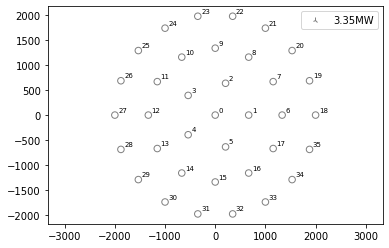

In [275]:
site=IEA37Site(36)
wt16_x,wt16_y = site.initial_position[:,0],site.initial_position[:,1]
plt.figure()
#aep = simulationResult.aep()
windTurbines.plot(wt16_x,wt16_y)
#c =plt.scatter(wt16_x, wt16_y, c=aep.sum(['wd','ws']))
#plt.colorbar(c, label='AEP [GWh]')

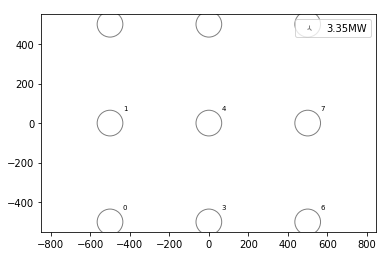

In [271]:
site=IEA37Site(9)
wt16_x,wt16_y = site.initial_position[:,0],site.initial_position[:,1]
plt.figure()
#aep = simulationResult.aep()
windTurbines.plot(wt16_x,wt16_y)
#c =plt.scatter(wt16_x, wt16_y, c=aep.sum(['wd','ws']))
#plt.colorbar(c, label='AEP [GWh]')

In [268]:
dist_origin=[]
for _ in range(64):
    dist_origin.append(np.sqrt(site.initial_position[_][0]**2+site.initial_position[_][1]**2))
    
dist_origin

[0.0,
 750.0,
 749.9999980060334,
 749.9999399096642,
 749.9999399096642,
 749.9999980060334,
 1500.0,
 1499.99999508387,
 1499.99999508387,
 1500.0,
 1499.99999508387,
 1499.99999508387,
 1500.0,
 1499.99999508387,
 1499.99999508387,
 1500.0,
 1499.99999508387,
 1499.99999508387,
 2250.0,
 2249.999995347255,
 2249.9999882752018,
 2250.0000359270753,
 2249.9999564385153,
 2249.9999564385153,
 2250.0000359270753,
 2249.9999882752018,
 2249.999995347255,
 2250.0,
 2249.999995347255,
 2249.9999882752018,
 2250.0000359270753,
 2249.9999564385153,
 2249.9999564385153,
 2250.0000359270753,
 2249.9999882752018,
 2249.999995347255,
 3000.0,
 2999.9999639549214,
 2999.999989130833,
 2999.9999594612864,
 2999.9999594612864,
 2999.999989130833,
 2999.9999639549214,
 3000.0,
 2999.9999639549214,
 2999.999989130833,
 2999.9999594612864,
 2999.9999594612864,
 2999.999989130833,
 2999.9999639549214,
 3000.0,
 2999.9999639549214,
 2999.999989130833,
 2999.9999594612864,
 2999.9999594612864,
 2999.9999

In [245]:
site.distances(src_x_i=[wt_x], src_y_i=[wt_y], src_h_i=[70],
                                             dst_x_j=[wt_x], dst_y_j=[wt_y-1000], dst_h_j=[90], # wt2 100m to the south
                                             wd_il=[wd])

(array([[[1000.        ,  866.02540378,    0.        ]]]),
 array([[[6.123234e-14, 5.000000e+02, 1.000000e+03]]]),
 array([[[20., 20., 20.]]]),
 array([[0],
        [0],
        [0]], dtype=int64))

### Plot Wind Rose (12 wd bins)

In [116]:
site.local_wind(x_i=site.initial_position[:,0],
               y_i=site.initial_position[:,1],
               h_i=site.initial_position[:,0]*0+70)

<xarray.LocalWind>
Dimensions:   (i: 9, wd: 360, ws: 1)
Coordinates:
  * ws        (ws) float64 9.8
  * wd        (wd) int32 0 1 2 3 4 5 6 7 8 ... 352 353 354 355 356 357 358 359
  * i         (i) int32 0 1 2 3 4 5 6 7 8
    x         (i) float64 -500.0 -500.0 -500.0 0.0 0.0 0.0 500.0 500.0 500.0
    y         (i) float64 -500.0 0.0 500.0 -500.0 0.0 500.0 -500.0 0.0 500.0
    h         (i) float64 70.0 70.0 70.0 70.0 70.0 70.0 70.0 70.0 70.0
Data variables:
    WS        (ws) float64 9.8
    WD        (wd) int32 0 1 2 3 4 5 6 7 8 ... 352 353 354 355 356 357 358 359
    TI        float64 0.075
    ws_lower  (ws) float64 9.3
    ws_upper  (ws) float64 10.3
    P         (wd) float64 0.001111 0.001111 0.001111 ... 0.001111 0.001111
Attributes:
    wd_bin_size:  1

<xarray.DataArray 'P' (wd: 1, ws: 300)>
array([[0.00333333, 0.00333333, 0.00333333, 0.00333333, 0.00333333,
        0.00333333, 0.00333333, 0.00333333, 0.00333333, 0.00333333,
        0.00333333, 0.00333333, 0.00333333, 0.00333333, 0.00333333,
        0.00333333, 0.00333333, 0.00333333, 0.00333333, 0.00333333,
        0.00333333, 0.00333333, 0.00333333, 0.00333333, 0.00333333,
        0.00333333, 0.00333333, 0.00333333, 0.00333333, 0.00333333,
        0.00333333, 0.00333333, 0.00333333, 0.00333333, 0.00333333,
        0.00333333, 0.00333333, 0.00333333, 0.00333333, 0.00333333,
        0.00333333, 0.00333333, 0.00333333, 0.00333333, 0.00333333,
        0.00333333, 0.00333333, 0.00333333, 0.00333333, 0.00333333,
        0.00333333, 0.00333333, 0.00333333, 0.00333333, 0.00333333,
        0.00333333, 0.00333333, 0.00333333, 0.00333333, 0.00333333,
        0.00333333, 0.00333333, 0.00333333, 0.00333333, 0.00333333,
        0.00333333, 0.00333333, 0.00333333, 0.00333333, 0.00333333,
        0.00333333, 0.00333333, 0.00333333, 0.00333333, 0.00333333,
        0.00333333, 0.00333333, 0.00333333, 0.00333333, 0.00333333,
        0.00333333, 0.00333333, 0.00333333, 0.00333333, 0.00333333,
        0.00333333, 0.00333333, 0.00333333, 0.00333333, 0.00333333,
        0.00333333, 0.00333333, 0.00333333, 0.00333333, 0.00333333,
        0.00333333, 0.00333333, 0.00333333, 0.00333333, 0.00333333,
...
        0.00333333, 0.00333333, 0.00333333, 0.00333333, 0.00333333,
        0.00333333, 0.00333333, 0.00333333, 0.00333333, 0.00333333,
        0.00333333, 0.00333333, 0.00333333, 0.00333333, 0.00333333,
        0.00333333, 0.00333333, 0.00333333, 0.00333333, 0.00333333,
        0.00333333, 0.00333333, 0.00333333, 0.00333333, 0.00333333,
        0.00333333, 0.00333333, 0.00333333, 0.00333333, 0.00333333,
        0.00333333, 0.00333333, 0.00333333, 0.00333333, 0.00333333,
        0.00333333, 0.00333333, 0.00333333, 0.00333333, 0.00333333,
        0.00333333, 0.00333333, 0.00333333, 0.00333333, 0.00333333,
        0.00333333, 0.00333333, 0.00333333, 0.00333333, 0.00333333,
        0.00333333, 0.00333333, 0.00333333, 0.00333333, 0.00333333,
        0.00333333, 0.00333333, 0.00333333, 0.00333333, 0.00333333,
        0.00333333, 0.00333333, 0.00333333, 0.00333333, 0.00333333,
        0.00333333, 0.00333333, 0.00333333, 0.00333333, 0.00333333,
        0.00333333, 0.00333333, 0.00333333, 0.00333333, 0.00333333,
        0.00333333, 0.00333333, 0.00333333, 0.00333333, 0.00333333,
        0.00333333, 0.00333333, 0.00333333, 0.00333333, 0.00333333,
        0.00333333, 0.00333333, 0.00333333, 0.00333333, 0.00333333,
        0.00333333, 0.00333333, 0.00333333, 0.00333333, 0.00333333,
        0.00333333, 0.00333333, 0.00333333, 0.00333333, 0.00333333]])
Coordinates:
  * wd       (wd) int32 0
  * ws       (ws) float64 0.05 0.15 0.25 0.35 0.45 ... 29.65 29.75 29.85 29.95

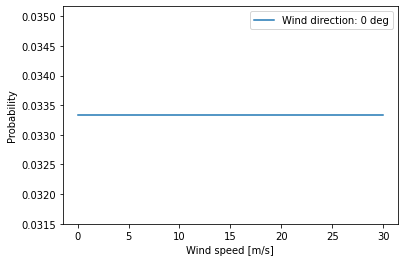

In [115]:
site.plot_ws_distribution(x=site.initial_position[0][0],
                         y=site.initial_position[0][1],
                         include_wd_distribution=False)

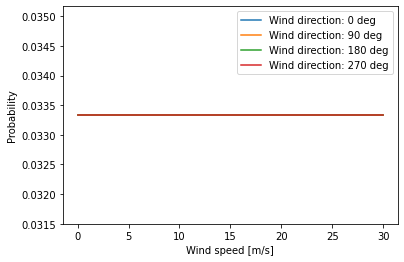

In [149]:
_ = site.plot_ws_distribution(wd=[0,90,180,270])

<xarray.DataArray 'P' (sector: 12)>
array([0.03275556, 0.03466667, 0.04457778, 0.08075556, 0.10533333,
       0.15191111, 0.08742222, 0.0512    , 0.08915556, 0.23697778,
       0.05386667, 0.03422222])
Coordinates:
  * sector   (sector) int64 0 1 2 3 4 5 6 7 8 9 10 11

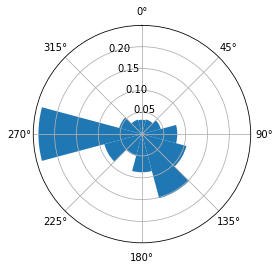

In [153]:
site.plot_wd_distribution(n_wd=12)

# Attributes of the Wind Turbines

In [124]:
wind_turbines = IEA37_WindTurbines()

In [125]:
print(f'WT Hub Heigth {wind_turbines.hub_height()}')
print(f'model {wind_turbines.name()}')
print(f'power {wind_turbines.power(ws_i=10)}')

WT Hub Heigth 110.0
model 3.35MW
power [3350000.]


### Py Wake model:
- IEA37SimpleBastankhahGaussian
- Constant Wind Speed 9.8 m/s

In [84]:
wake_model = IEA37SimpleBastankhahGaussian(site, wind_turbines)

In [133]:
wake_model(site.initial_position[:,0],site.initial_position[:,1])

<xarray.SimulationResult>
Dimensions:   (wd: 360, ws: 1, wt: 9)
Coordinates:
  * wt        (wt) int32 0 1 2 3 4 5 6 7 8
  * wd        (wd) int32 0 1 2 3 4 5 6 7 8 ... 352 353 354 355 356 357 358 359
  * ws        (ws) float64 9.8
    x         (wt) float64 -500.0 -500.0 -500.0 0.0 0.0 0.0 500.0 500.0 500.0
    y         (wt) float64 -500.0 0.0 500.0 -500.0 0.0 500.0 -500.0 0.0 500.0
    h         (wt) float64 110.0 110.0 110.0 110.0 110.0 110.0 110.0 110.0 110.0
    type      (wt) int32 0 0 0 0 0 0 0 0 0
Data variables:
    WS_eff    (wt, wd, ws) float64 6.584 6.628 6.752 6.945 ... 9.8 9.8 9.8 9.8
    TI_eff    (wt, wd, ws) float64 0.075 0.075 0.075 0.075 ... 0.075 0.075 0.075
    Power     (wt, wd, ws) float64 2.963e+05 3.115e+05 ... 3.35e+06 3.35e+06
    CT        (wt, wd, ws) float64 0.8889 0.8889 0.8889 ... 0.8889 0.8889 0.8889
    WS        (ws) float64 9.8
    WD        (wd) int32 0 1 2 3 4 5 6 7 8 ... 352 353 354 355 356 357 358 359
    TI        float64 0.075
    ws_lower  (ws) float64 9.3
    ws_upper  (ws) float64 10.3
    P         (wd) float64 0.001111 0.001111 0.001111 ... 0.001111 0.001111
    Yaw       (wt, wd, ws) float64 0.0 0.0 0.0 0.0 0.0 ... 0.0 0.0 0.0 0.0 0.0
Attributes:
    wd_bin_size:  1

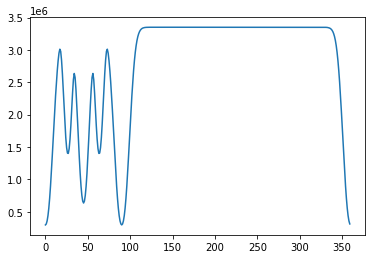

In [146]:
plt.plot(wake_model(site.initial_position[:,0],site.initial_position[:,1])['Power'][0])

In [160]:
wake_model.aep(x=site.initial_position[:,0],y=site.initial_position[:,1])

195.68705230574596

### Min spacing, Cirlce Radius and Circle center

In [215]:
print('min spacing',get_iea37_constraints(n_wt)[0].min_spacing)
print('radius',get_iea37_constraints(n_wt)[1].radius)
print('center',get_iea37_constraints(n_wt)[1].center)

min spacing 260.0
radius 900
center [0 0]


### Define cost function. 
- The site has the wind direction discretized into 16 bins

In [7]:
def get_iea37_cost(n_wt=9, n_wd=16):
    """Cost component that wraps the IEA 37 AEP calculator"""
    wd = np.linspace(0., 360., n_wd, endpoint=False)
    site = IEA37Site(n_wt)
    wind_turbines = IEA37_WindTurbines()
    wake_model = IEA37SimpleBastankhahGaussian(site, wind_turbines)
    return PyWakeAEPCostModelComponent(wake_model, n_wt, wd=wd)

In [8]:
def optimize_iea37_locs(n_wt, n_wd, driver, state=None):
    """
    Parameters
    ----------
    - n_wt: int
        Number of wind turbines

    - n_wd: int
        Number of wind directions to consider for the AEP

    - driver: TopfarmDriver instance
        The optimization algorithm to use

    - state: dict(x=[], y=[]) [default=None]
        State to start from the optimization

    Returns
    -------
    - state: The state after the optimization

    """

    initial = get_iea37_initial(n_wt)
    design_vars = dict(zip('xy', (initial[:, :2]).T))

    tf = TopFarmProblem(
            design_vars,
            get_iea37_cost(n_wt, n_wd=n_wd),
            constraints=get_iea37_constraints(n_wt),
            driver=driver,
            plot_comp=XYPlotComp())

    if not state:
        _, state = tf.evaluate()

    cost, state, recorder= tf.optimize(state)
    return cost, state, recorder

# Optimization for 9 wt

## $\color{red}{\text{Here the initial aep is 175 GWh }}$

In [281]:
help(EasyScipyOptimizeDriver)

Help on class EasyScipyOptimizeDriver in module topfarm.easy_drivers:

class EasyScipyOptimizeDriver(openmdao.drivers.scipy_optimizer.ScipyOptimizeDriver, EasyDriverBase)
 |  EasyScipyOptimizeDriver(optimizer='SLSQP', maxiter=200, tol=1e-08, disp=True, **kwargs)
 |  
 |  Driver wrapper for the scipy.optimize.minimize family of local optimizers.
 |  
 |  Inequality constraints are supported by COBYLA and SLSQP,
 |  but equality constraints are only supported by SLSQP. None of the other
 |  optimizers support constraints.
 |  
 |  ScipyOptimizeDriver supports the following:
 |      equality_constraints
 |      inequality_constraints
 |  
 |  Attributes
 |  ----------
 |  fail : bool
 |      Flag that indicates failure of most recent optimization.
 |  iter_count : int
 |      Counter for function evaluations.
 |  result : OptimizeResult
 |      Result returned from scipy.optimize call.
 |  opt_settings : dict
 |      Dictionary of solver-specific options. See the scipy.optimize.minimize d

Calculate flow interaction: 100%|██████████| 9/9 [00:00<00:00, 902.26wt/s]


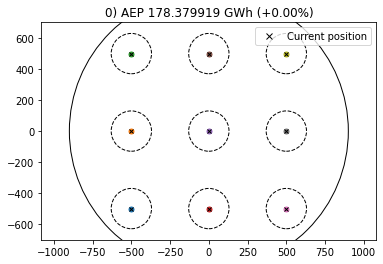

Calculate flow interaction: 100%|██████████| 9/9 [00:00<00:00, 2254.60wt/s]


Calculate flow interaction: 100%|██████████| 9/9 [00:00<00:00, 1814.93wt/s]


Calculate flow interaction: 100%|██████████| 9/9 [00:00<00:00, 2263.11wt/s]


Calculate flow interaction: 100%|██████████| 9/9 [00:00<00:00, 2974.45wt/s]


Calculate flow interaction: 100%|██████████| 9/9 [00:00<00:00, 2256.35wt/s]


Calculate flow interaction: 100%|██████████| 9/9 [00:00<00:00, 3007.63wt/s]


Calculate flow interaction: 100%|██████████| 9/9 [00:00<00:00, 1497.55wt/s]


Calculate flow interaction: 100%|██████████| 9/9 [00:00<00:00, 2256.75wt/s]


Calculate flow interaction: 100%|██████████| 9/9 [00:00<00:00, 3008.83wt/s]


Calculate flow interaction: 100%|██████████| 9/9 [00:00<00:00, 3004.04wt/s]


Calculate flow interaction: 100%|██████████| 9/9 [00:00<00:00, 3007.63wt/s]


Calculate flow interaction: 100%|██████████| 9/9 [00:00<00:00, 2255.81wt/s]


Calculate flow interaction: 100%|██████████| 9/9 [00:00<00:00, 2981.03wt/s]


Calculate flow interaction: 100%|██████████| 9/9 [00:00<00:00, 1503.99wt/s]


Calculate flow interaction: 100%|██████████| 9/9 [00:00<00:00, 1804.43wt/s]


Calculate flow interaction: 100%|██████████| 9/9 [00:00<00:00, 3006.19wt/s]


Calculate flow interaction: 100%|██████████| 9/9 [00:00<00:00, 1804.69wt/s]


Calculate flow interaction: 100%|██████████| 9/9 [00:00<00:00, 3008.83wt/s]


Calculate flow interaction: 100%|██████████| 9/9 [00:00<00:00, 3004.99wt/s]


Calculate flow interaction: 100%|██████████| 9/9 [00:00<00:00, 3007.87wt/s]


Calculate flow interaction: 100%|██████████| 9/9 [00:00<00:00, 3007.63wt/s]


Calculate flow interaction: 100%|██████████| 9/9 [00:00<00:00, 2247.48wt/s]


Calculate flow interaction: 100%|██████████| 9/9 [00:00<00:00, 2256.22wt/s]


Calculate flow interaction: 100%|██████████| 9/9 [00:00<00:00, 3007.87wt/s]


Calculate flow interaction: 100%|██████████| 9/9 [00:00<00:00, 3009.55wt/s]


Calculate flow interaction: 100%|██████████| 9/9 [00:00<00:00, 2255.68wt/s]


Calculate flow interaction: 100%|██████████| 9/9 [00:00<00:00, 3008.59wt/s]


Calculate flow interaction: 100%|██████████| 9/9 [00:00<00:00, 2241.35wt/s]


Calculate flow interaction: 100%|██████████| 9/9 [00:00<00:00, 3007.39wt/s]


Calculate flow interaction: 100%|██████████| 9/9 [00:00<00:00, 3008.35wt/s]


Calculate flow interaction: 100%|██████████| 9/9 [00:00<00:00, 3007.63wt/s]


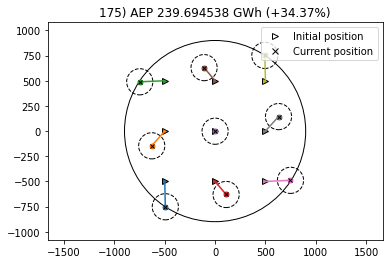

In [9]:
cost, state, recorder= optimize_iea37_locs(9, 16, EasyScipyOptimizeDriver(optimizer='SLSQP',disp=False))

In [11]:
cost_9wt_slsqp, state_9wt_slsqp, recorder_9wt_slsqp = cost, state, recorder

In [284]:
recorder_9wt_slsqp.driver_iteration_dict['iteration_coordinate']

['rank0:SLSQP|0',
 'rank0:SLSQP|1',
 'rank0:SLSQP|2',
 'rank0:SLSQP|3',
 'rank0:SLSQP|4',
 'rank0:SLSQP|5',
 'rank0:SLSQP|6',
 'rank0:SLSQP|7',
 'rank0:SLSQP|8',
 'rank0:SLSQP|9',
 'rank0:SLSQP|10',
 'rank0:SLSQP|11',
 'rank0:SLSQP|12',
 'rank0:SLSQP|13',
 'rank0:SLSQP|14',
 'rank0:SLSQP|15',
 'rank0:SLSQP|16',
 'rank0:SLSQP|17',
 'rank0:SLSQP|18',
 'rank0:SLSQP|19',
 'rank0:SLSQP|20',
 'rank0:SLSQP|21',
 'rank0:SLSQP|22',
 'rank0:SLSQP|23',
 'rank0:SLSQP|24',
 'rank0:SLSQP|25',
 'rank0:SLSQP|26',
 'rank0:SLSQP|27',
 'rank0:SLSQP|28',
 'rank0:SLSQP|29',
 'rank0:SLSQP|30',
 'rank0:SLSQP|31',
 'rank0:SLSQP|32',
 'rank0:SLSQP|33',
 'rank0:SLSQP|34',
 'rank0:SLSQP|35',
 'rank0:SLSQP|36',
 'rank0:SLSQP|37',
 'rank0:SLSQP|38',
 'rank0:SLSQP|39',
 'rank0:SLSQP|40',
 'rank0:SLSQP|41',
 'rank0:SLSQP|42',
 'rank0:SLSQP|43',
 'rank0:SLSQP|44',
 'rank0:SLSQP|45',
 'rank0:SLSQP|46',
 'rank0:SLSQP|47',
 'rank0:SLSQP|48',
 'rank0:SLSQP|49',
 'rank0:SLSQP|50',
 'rank0:SLSQP|51',
 'rank0:SLSQP|52',
 'r

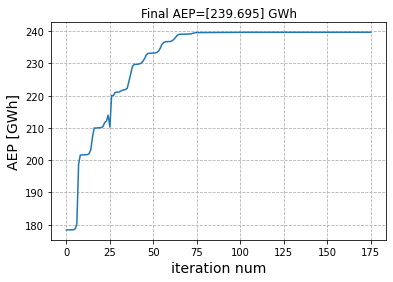

In [204]:
AEPs_9sls = recorder_9wt_slsqp.driver_iteration_dict['AEP']
plt.plot(AEPs_9sls )
plt.grid(linestyle='--')
plt.title(f'Final AEP={np.round(AEPs_9sls[-1],3)} GWh')
plt.ylabel('AEP [GWh]',fontsize=14)
plt.xlabel('iteration num',fontsize=14)
plt.show()

# Optimization for 16 wt

Calculate flow interaction: 100%|██████████| 16/16 [00:00<00:00, 3192.62wt/s]


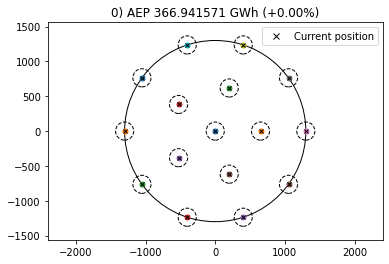

Calculate flow interaction: 100%|██████████| 16/16 [00:00<00:00, 3207.27wt/s]


Calculate flow interaction: 100%|██████████| 16/16 [00:00<00:00, 3208.34wt/s]


Calculate flow interaction: 100%|██████████| 16/16 [00:00<00:00, 2673.66wt/s]


Calculate flow interaction: 100%|██████████| 16/16 [00:00<00:00, 3185.65wt/s]


Calculate flow interaction: 100%|██████████| 16/16 [00:00<00:00, 3208.19wt/s]


Calculate flow interaction: 100%|██████████| 16/16 [00:00<00:00, 3190.95wt/s]


Calculate flow interaction: 100%|██████████| 16/16 [00:00<00:00, 3202.06wt/s]


Calculate flow interaction: 100%|██████████| 16/16 [00:00<00:00, 2674.19wt/s]


Calculate flow interaction: 100%|██████████| 16/16 [00:00<00:00, 3206.81wt/s]


Calculate flow interaction: 100%|██████████| 16/16 [00:00<00:00, 3208.95wt/s]


Calculate flow interaction: 100%|██████████| 16/16 [00:00<00:00, 3184.29wt/s]


Calculate flow interaction: 100%|██████████| 16/16 [00:00<00:00, 3191.71wt/s]


Calculate flow interaction: 100%|██████████| 16/16 [00:00<00:00, 3208.65wt/s]


Calculate flow interaction: 100%|██████████| 16/16 [00:00<00:00, 2673.34wt/s]


Calculate flow interaction: 100%|██████████| 16/16 [00:00<00:00, 2673.23wt/s]


Calculate flow interaction: 100%|██████████| 16/16 [00:00<00:00, 2673.66wt/s]


Calculate flow interaction: 100%|██████████| 16/16 [00:00<00:00, 2673.98wt/s]


Calculate flow interaction: 100%|██████████| 16/16 [00:00<00:00, 3208.95wt/s]


Calculate flow interaction: 100%|██████████| 16/16 [00:00<00:00, 3176.60wt/s]


Calculate flow interaction: 100%|██████████| 16/16 [00:00<00:00, 2664.53wt/s]


Calculate flow interaction: 100%|██████████| 16/16 [00:00<00:00, 2673.87wt/s]


Calculate flow interaction: 100%|██████████| 16/16 [00:00<00:00, 3206.19wt/s]


Calculate flow interaction: 100%|██████████| 16/16 [00:00<00:00, 3192.92wt/s]


Calculate flow interaction: 100%|██████████| 16/16 [00:00<00:00, 2690.49wt/s]


Calculate flow interaction: 100%|██████████| 16/16 [00:00<00:00, 3208.65wt/s]


Calculate flow interaction: 100%|██████████| 16/16 [00:00<00:00, 2673.87wt/s]


Calculate flow interaction: 100%|██████████| 16/16 [00:00<00:00, 3208.80wt/s]


Calculate flow interaction: 100%|██████████| 16/16 [00:00<00:00, 3225.46wt/s]


Calculate flow interaction: 100%|██████████| 16/16 [00:00<00:00, 2291.50wt/s]


Calculate flow interaction: 100%|██████████| 16/16 [00:00<00:00, 2674.19wt/s]


Calculate flow interaction: 100%|██████████| 16/16 [00:00<00:00, 4011.05wt/s]


Calculate flow interaction: 100%|██████████| 16/16 [00:00<00:00, 3208.95wt/s]


Calculate flow interaction: 100%|██████████| 16/16 [00:00<00:00, 2662.21wt/s]


Calculate flow interaction: 100%|██████████| 16/16 [00:00<00:00, 3208.80wt/s]


Calculate flow interaction: 100%|██████████| 16/16 [00:00<00:00, 3209.57wt/s]


Calculate flow interaction: 100%|██████████| 16/16 [00:00<00:00, 2674.30wt/s]


Calculate flow interaction: 100%|██████████| 16/16 [00:00<00:00, 2673.55wt/s]


Calculate flow interaction: 100%|██████████| 16/16 [00:00<00:00, 3205.28wt/s]


Calculate flow interaction: 100%|██████████| 16/16 [00:00<00:00, 3208.80wt/s]


Calculate flow interaction: 100%|██████████| 16/16 [00:00<00:00, 2671.21wt/s]


Calculate flow interaction: 100%|██████████| 16/16 [00:00<00:00, 3208.49wt/s]


Calculate flow interaction: 100%|██████████| 16/16 [00:00<00:00, 3208.34wt/s]


Calculate flow interaction: 100%|██████████| 16/16 [00:00<00:00, 2673.77wt/s]


Calculate flow interaction: 100%|██████████| 16/16 [00:00<00:00, 2673.66wt/s]


Calculate flow interaction: 100%|██████████| 16/16 [00:00<00:00, 3225.15wt/s]


Calculate flow interaction: 100%|██████████| 16/16 [00:00<00:00, 3208.65wt/s]


Calculate flow interaction: 100%|██████████| 16/16 [00:00<00:00, 2673.77wt/s]


Calculate flow interaction: 100%|██████████| 16/16 [00:00<00:00, 2292.67wt/s]


Calculate flow interaction: 100%|██████████| 16/16 [00:00<00:00, 2678.25wt/s]


Calculate flow interaction: 100%|██████████| 16/16 [00:00<00:00, 3208.65wt/s]


Calculate flow interaction: 100%|██████████| 16/16 [00:00<00:00, 2653.05wt/s]


Calculate flow interaction: 100%|██████████| 16/16 [00:00<00:00, 2674.09wt/s]


Calculate flow interaction: 100%|██████████| 16/16 [00:00<00:00, 3191.86wt/s]


Calculate flow interaction: 100%|██████████| 16/16 [00:00<00:00, 2673.55wt/s]


Calculate flow interaction: 100%|██████████| 16/16 [00:00<00:00, 2673.77wt/s]


Calculate flow interaction: 100%|██████████| 16/16 [00:00<00:00, 2673.98wt/s]


Calculate flow interaction: 100%|██████████| 16/16 [00:00<00:00, 2673.98wt/s]


Calculate flow interaction: 100%|██████████| 16/16 [00:00<00:00, 2283.24wt/s]


Calculate flow interaction: 100%|██████████| 16/16 [00:00<00:00, 3192.32wt/s]


Calculate flow interaction: 100%|██████████| 16/16 [00:00<00:00, 2674.62wt/s]


Calculate flow interaction: 100%|██████████| 16/16 [00:00<00:00, 2670.15wt/s]


Calculate flow interaction: 100%|██████████| 16/16 [00:00<00:00, 3192.16wt/s]


Calculate flow interaction: 100%|██████████| 16/16 [00:00<00:00, 3208.65wt/s]


Optimization FAILED.
Iteration limit reached
-----------------------------------


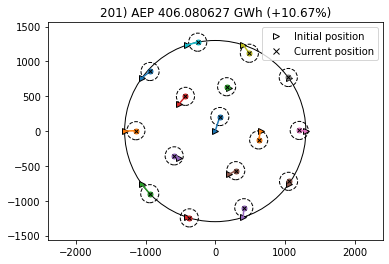

In [12]:
#cost, state, recorder= optimize_iea37_locs(16, 16, EasyScipyOptimizeDriver(optimizer='SLSQP', maxiter=400 ,disp=False))

Calculate flow interaction: 100%|██████████| 16/16 [00:00<00:00, 3214.03wt/s]


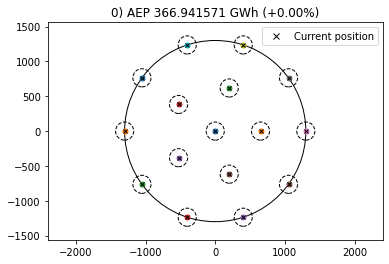

Calculate flow interaction: 100%|██████████| 16/16 [00:00<00:00, 3197.18wt/s]


Calculate flow interaction: 100%|██████████| 16/16 [00:00<00:00, 2661.89wt/s]


Calculate flow interaction: 100%|██████████| 16/16 [00:00<00:00, 2674.51wt/s]


Calculate flow interaction: 100%|██████████| 16/16 [00:00<00:00, 2673.77wt/s]


Calculate flow interaction: 100%|██████████| 16/16 [00:00<00:00, 3208.65wt/s]


Calculate flow interaction: 100%|██████████| 16/16 [00:00<00:00, 3207.11wt/s]


Calculate flow interaction: 100%|██████████| 16/16 [00:00<00:00, 2673.55wt/s]


Calculate flow interaction: 100%|██████████| 16/16 [00:00<00:00, 2674.30wt/s]


Calculate flow interaction: 100%|██████████| 16/16 [00:00<00:00, 2292.05wt/s]


Calculate flow interaction: 100%|██████████| 16/16 [00:00<00:00, 3208.80wt/s]


Calculate flow interaction: 100%|██████████| 16/16 [00:00<00:00, 3209.11wt/s]


Calculate flow interaction: 100%|██████████| 16/16 [00:00<00:00, 2662.52wt/s]


Calculate flow interaction: 100%|██████████| 16/16 [00:00<00:00, 3209.11wt/s]


Calculate flow interaction: 100%|██████████| 16/16 [00:00<00:00, 2673.13wt/s]


Calculate flow interaction: 100%|██████████| 16/16 [00:00<00:00, 4010.81wt/s]


Calculate flow interaction: 100%|██████████| 16/16 [00:00<00:00, 2662.42wt/s]


Calculate flow interaction: 100%|██████████| 16/16 [00:00<00:00, 3209.11wt/s]


Calculate flow interaction: 100%|██████████| 16/16 [00:00<00:00, 3208.65wt/s]


Calculate flow interaction: 100%|██████████| 16/16 [00:00<00:00, 4011.05wt/s]


Calculate flow interaction: 100%|██████████| 16/16 [00:00<00:00, 3208.49wt/s]


Calculate flow interaction: 100%|██████████| 16/16 [00:00<00:00, 3208.19wt/s]


Calculate flow interaction: 100%|██████████| 16/16 [00:00<00:00, 3208.65wt/s]


Calculate flow interaction: 100%|██████████| 16/16 [00:00<00:00, 3200.84wt/s]


Calculate flow interaction: 100%|██████████| 16/16 [00:00<00:00, 1782.49wt/s]


Calculate flow interaction: 100%|██████████| 16/16 [00:00<00:00, 3985.09wt/s]


Calculate flow interaction: 100%|██████████| 16/16 [00:00<00:00, 3208.03wt/s]


Calculate flow interaction: 100%|██████████| 16/16 [00:00<00:00, 3209.41wt/s]


Calculate flow interaction: 100%|██████████| 16/16 [00:00<00:00, 3191.71wt/s]


Calculate flow interaction: 100%|██████████| 16/16 [00:00<00:00, 2664.64wt/s]


Calculate flow interaction: 100%|██████████| 16/16 [00:00<00:00, 2292.20wt/s]


Calculate flow interaction: 100%|██████████| 16/16 [00:00<00:00, 2662.42wt/s]


Calculate flow interaction: 100%|██████████| 16/16 [00:00<00:00, 1336.46wt/s]


Calculate flow interaction: 100%|██████████| 16/16 [00:00<00:00, 2674.83wt/s]


Calculate flow interaction: 100%|██████████| 16/16 [00:00<00:00, 3208.19wt/s]


Calculate flow interaction: 100%|██████████| 16/16 [00:00<00:00, 3220.81wt/s]


Calculate flow interaction: 100%|██████████| 16/16 [00:00<00:00, 3208.49wt/s]


Calculate flow interaction: 100%|██████████| 16/16 [00:00<00:00, 2674.51wt/s]


Calculate flow interaction: 100%|██████████| 16/16 [00:00<00:00, 2659.04wt/s]


Calculate flow interaction: 100%|██████████| 16/16 [00:00<00:00, 2677.29wt/s]


Calculate flow interaction: 100%|██████████| 16/16 [00:00<00:00, 2655.04wt/s]


Calculate flow interaction: 100%|██████████| 16/16 [00:00<00:00, 2293.38wt/s]


Calculate flow interaction: 100%|██████████| 16/16 [00:00<00:00, 2296.83wt/s]


Calculate flow interaction: 100%|██████████| 16/16 [00:00<00:00, 2672.38wt/s]


Calculate flow interaction: 100%|██████████| 16/16 [00:00<00:00, 2291.73wt/s]


Calculate flow interaction: 100%|██████████| 16/16 [00:00<00:00, 3208.80wt/s]


Calculate flow interaction: 100%|██████████| 16/16 [00:00<00:00, 3201.00wt/s]


Calculate flow interaction: 100%|██████████| 16/16 [00:00<00:00, 2673.34wt/s]


Calculate flow interaction: 100%|██████████| 16/16 [00:00<00:00, 3208.95wt/s]


Calculate flow interaction: 100%|██████████| 16/16 [00:00<00:00, 3209.11wt/s]


Calculate flow interaction: 100%|██████████| 16/16 [00:00<00:00, 3208.65wt/s]


Calculate flow interaction: 100%|██████████| 16/16 [00:00<00:00, 2290.40wt/s]


Calculate flow interaction: 100%|██████████| 16/16 [00:00<00:00, 2685.75wt/s]


Calculate flow interaction: 100%|██████████| 16/16 [00:00<00:00, 2673.87wt/s]


Calculate flow interaction: 100%|██████████| 16/16 [00:00<00:00, 3209.72wt/s]


Calculate flow interaction: 100%|██████████| 16/16 [00:00<00:00, 2674.41wt/s]


Calculate flow interaction: 100%|██████████| 16/16 [00:00<00:00, 3187.31wt/s]


Calculate flow interaction: 100%|██████████| 16/16 [00:00<00:00, 3213.87wt/s]


Calculate flow interaction: 100%|██████████| 16/16 [00:00<00:00, 3208.80wt/s]


Calculate flow interaction: 100%|██████████| 16/16 [00:00<00:00, 2674.73wt/s]


Calculate flow interaction: 100%|██████████| 16/16 [00:00<00:00, 3209.11wt/s]


Calculate flow interaction: 100%|██████████| 16/16 [00:00<00:00, 3208.95wt/s]


Calculate flow interaction: 100%|██████████| 16/16 [00:00<00:00, 2290.09wt/s]


Calculate flow interaction: 100%|██████████| 16/16 [00:00<00:00, 3209.11wt/s]


Calculate flow interaction: 100%|██████████| 16/16 [00:00<00:00, 2673.77wt/s]


Calculate flow interaction: 100%|██████████| 16/16 [00:00<00:00, 4010.57wt/s]


Calculate flow interaction: 100%|██████████| 16/16 [00:00<00:00, 3208.80wt/s]


Calculate flow interaction: 100%|██████████| 16/16 [00:00<00:00, 2674.19wt/s]


Calculate flow interaction: 100%|██████████| 16/16 [00:00<00:00, 3209.11wt/s]


Calculate flow interaction: 100%|██████████| 16/16 [00:00<00:00, 2674.30wt/s]


Calculate flow interaction: 100%|██████████| 16/16 [00:00<00:00, 2670.36wt/s]


Calculate flow interaction: 100%|██████████| 16/16 [00:00<00:00, 3208.34wt/s]


Calculate flow interaction: 100%|██████████| 16/16 [00:00<00:00, 4011.05wt/s]


Calculate flow interaction: 100%|██████████| 16/16 [00:00<00:00, 3209.26wt/s]


Calculate flow interaction: 100%|██████████| 16/16 [00:00<00:00, 2672.38wt/s]


Calculate flow interaction: 100%|██████████| 16/16 [00:00<00:00, 3208.34wt/s]


Calculate flow interaction: 100%|██████████| 16/16 [00:00<00:00, 4011.77wt/s]


Calculate flow interaction: 100%|██████████| 16/16 [00:00<00:00, 2005.05wt/s]


Calculate flow interaction: 100%|██████████| 16/16 [00:00<00:00, 2291.81wt/s]


Calculate flow interaction: 100%|██████████| 16/16 [00:00<00:00, 3208.19wt/s]


Calculate flow interaction: 100%|██████████| 16/16 [00:00<00:00, 2286.04wt/s]


Calculate flow interaction: 100%|██████████| 16/16 [00:00<00:00, 2292.28wt/s]


Calculate flow interaction: 100%|██████████| 16/16 [00:00<00:00, 3208.03wt/s]


Calculate flow interaction: 100%|██████████| 16/16 [00:00<00:00, 3209.57wt/s]


Calculate flow interaction: 100%|██████████| 16/16 [00:00<00:00, 2669.09wt/s]


Calculate flow interaction: 100%|██████████| 16/16 [00:00<00:00, 2678.78wt/s]


Calculate flow interaction: 100%|██████████| 16/16 [00:00<00:00, 2668.77wt/s]


Calculate flow interaction: 100%|██████████| 16/16 [00:00<00:00, 1145.20wt/s]


Calculate flow interaction: 100%|██████████| 16/16 [00:00<00:00, 2675.05wt/s]


Calculate flow interaction: 100%|██████████| 16/16 [00:00<00:00, 2673.77wt/s]


Calculate flow interaction: 100%|██████████| 16/16 [00:00<00:00, 2290.33wt/s]


Calculate flow interaction: 100%|██████████| 16/16 [00:00<00:00, 3182.78wt/s]


Calculate flow interaction: 100%|██████████| 16/16 [00:00<00:00, 2673.66wt/s]


Calculate flow interaction: 100%|██████████| 16/16 [00:00<00:00, 3210.03wt/s]


Calculate flow interaction: 100%|██████████| 16/16 [00:00<00:00, 2291.81wt/s]


Calculate flow interaction: 100%|██████████| 16/16 [00:00<00:00, 3192.01wt/s]


Calculate flow interaction: 100%|██████████| 16/16 [00:00<00:00, 3191.86wt/s]


Calculate flow interaction: 100%|██████████| 16/16 [00:00<00:00, 3206.65wt/s]


Calculate flow interaction: 100%|██████████| 16/16 [00:00<00:00, 3208.65wt/s]


Calculate flow interaction: 100%|██████████| 16/16 [00:00<00:00, 3208.95wt/s]


Calculate flow interaction: 100%|██████████| 16/16 [00:00<00:00, 2673.02wt/s]


Calculate flow interaction: 100%|██████████| 16/16 [00:00<00:00, 3203.29wt/s]


Calculate flow interaction: 100%|██████████| 16/16 [00:00<00:00, 2674.30wt/s]


Calculate flow interaction: 100%|██████████| 16/16 [00:00<00:00, 2676.22wt/s]


Calculate flow interaction: 100%|██████████| 16/16 [00:00<00:00, 2673.98wt/s]


Calculate flow interaction: 100%|██████████| 16/16 [00:00<00:00, 3212.49wt/s]


Calculate flow interaction: 100%|██████████| 16/16 [00:00<00:00, 3208.65wt/s]


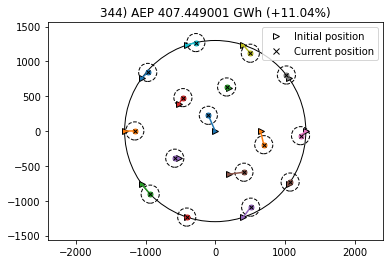

In [15]:
cost, state, recorder= optimize_iea37_locs(16, 16, EasyScipyOptimizeDriver(optimizer='SLSQP', maxiter=400 ,disp=False))

In [16]:
cost_16wt_slsqp, state_16wt_slsqp, recorder_16wt_slsqp = cost, state, recorder

In [31]:
recorder_16wt_slsqp.driver_iteration_dict.keys()

dict_keys(['y', 'x', 'aggr_cost', 'wtSeparationSquared', 'boundaryDistances', 'penalty_circle_boundary_comp_0_0_1300', 'cost', 'cost_comp_eval', 'penalty', 'xy_boundary', 'plot_counter', 'penalty_spacing_comp_260', 'AEP', 'counter', 'iteration_coordinate', 'timestamp', 'success', 'msg'])

In [33]:
last_iter=max(recorder_16wt_slsqp.driver_iteration_dict['counter'])
print(last_iter)

345


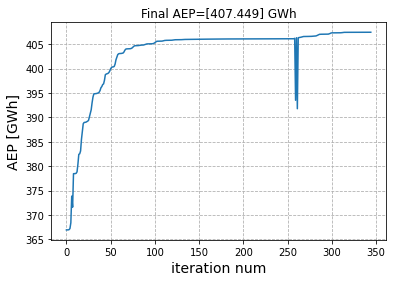

In [194]:
AEPs = recorder_16wt_slsqp.driver_iteration_dict['AEP']
plt.plot(AEPs)
plt.grid(linestyle='--')
plt.title(f'Final AEP={np.round(AEPs[-1],3)} GWh')
plt.ylabel('AEP [GWh]',fontsize=14)
plt.xlabel('iteration num',fontsize=14)
plt.show()

# Optimization for 36 wt

Calculate flow interaction: 100%|██████████| 36/36 [00:00<00:00, 3611.46wt/s]


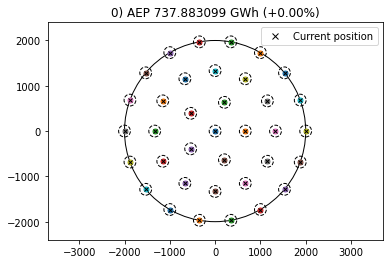

Calculate flow interaction: 100%|██████████| 36/36 [00:00<00:00, 3008.11wt/s]


Calculate flow interaction: 100%|██████████| 36/36 [00:00<00:00, 2406.64wt/s]


Calculate flow interaction: 100%|██████████| 36/36 [00:00<00:00, 3007.75wt/s]


Calculate flow interaction: 100%|██████████| 36/36 [00:00<00:00, 3014.71wt/s]


Calculate flow interaction: 100%|██████████| 36/36 [00:00<00:00, 2776.25wt/s]


Calculate flow interaction: 100%|██████████| 36/36 [00:00<00:00, 3001.89wt/s]


Calculate flow interaction: 100%|██████████| 36/36 [00:00<00:00, 3008.11wt/s]


Calculate flow interaction: 100%|██████████| 36/36 [00:00<00:00, 2768.67wt/s]


Calculate flow interaction: 100%|██████████| 36/36 [00:00<00:00, 2776.10wt/s]


Calculate flow interaction: 100%|██████████| 36/36 [00:00<00:00, 3002.42wt/s]


Calculate flow interaction: 100%|██████████| 36/36 [00:00<00:00, 2773.09wt/s]


Calculate flow interaction: 100%|██████████| 36/36 [00:00<00:00, 3015.13wt/s]


Calculate flow interaction: 100%|██████████| 36/36 [00:00<00:00, 3007.75wt/s]


Calculate flow interaction: 100%|██████████| 36/36 [00:00<00:00, 3007.93wt/s]


Calculate flow interaction: 100%|██████████| 36/36 [00:00<00:00, 3022.68wt/s]


Calculate flow interaction: 100%|██████████| 36/36 [00:00<00:00, 3008.05wt/s]


Calculate flow interaction: 100%|██████████| 36/36 [00:00<00:00, 2406.22wt/s]


Calculate flow interaction: 100%|██████████| 36/36 [00:00<00:00, 2578.29wt/s]


Calculate flow interaction: 100%|██████████| 36/36 [00:00<00:00, 2768.97wt/s]


Calculate flow interaction: 100%|██████████| 36/36 [00:00<00:00, 2769.43wt/s]


Calculate flow interaction: 100%|██████████| 36/36 [00:00<00:00, 2770.96wt/s]


Calculate flow interaction: 100%|██████████| 36/36 [00:00<00:00, 2771.16wt/s]


Calculate flow interaction: 100%|██████████| 36/36 [00:00<00:00, 3007.45wt/s]


Calculate flow interaction: 100%|██████████| 36/36 [00:00<00:00, 3009.37wt/s]


Calculate flow interaction: 100%|██████████| 36/36 [00:00<00:00, 3008.05wt/s]


Calculate flow interaction: 100%|██████████| 36/36 [00:00<00:00, 2771.01wt/s]


Calculate flow interaction: 100%|██████████| 36/36 [00:00<00:00, 3281.64wt/s]


Calculate flow interaction: 100%|██████████| 36/36 [00:00<00:00, 3014.47wt/s]


Calculate flow interaction: 100%|██████████| 36/36 [00:00<00:00, 3001.47wt/s]


Calculate flow interaction: 100%|██████████| 36/36 [00:00<00:00, 3280.72wt/s]


Calculate flow interaction: 100%|██████████| 36/36 [00:00<00:00, 2776.87wt/s]


Calculate flow interaction: 100%|██████████| 36/36 [00:00<00:00, 3008.17wt/s]


Calculate flow interaction: 100%|██████████| 36/36 [00:00<00:00, 3274.10wt/s]


Calculate flow interaction: 100%|██████████| 36/36 [00:00<00:00, 2776.61wt/s]


Calculate flow interaction: 100%|██████████| 36/36 [00:00<00:00, 3009.37wt/s]


Calculate flow interaction: 100%|██████████| 36/36 [00:00<00:00, 2776.46wt/s]


Calculate flow interaction: 100%|██████████| 36/36 [00:00<00:00, 3014.29wt/s]


Calculate flow interaction: 100%|██████████| 36/36 [00:00<00:00, 2776.66wt/s]


Calculate flow interaction: 100%|██████████| 36/36 [00:00<00:00, 3011.11wt/s]


Calculate flow interaction: 100%|██████████| 36/36 [00:00<00:00, 3008.23wt/s]


Calculate flow interaction: 100%|██████████| 36/36 [00:00<00:00, 3008.29wt/s]


Calculate flow interaction: 100%|██████████| 36/36 [00:00<00:00, 2406.56wt/s]


Calculate flow interaction: 100%|██████████| 36/36 [00:00<00:00, 2771.36wt/s]


Calculate flow interaction: 100%|██████████| 36/36 [00:00<00:00, 2776.66wt/s]


Calculate flow interaction: 100%|██████████| 36/36 [00:00<00:00, 3010.39wt/s]


Calculate flow interaction: 100%|██████████| 36/36 [00:00<00:00, 2776.71wt/s]


Calculate flow interaction: 100%|██████████| 36/36 [00:00<00:00, 2123.31wt/s]


Calculate flow interaction: 100%|██████████| 36/36 [00:00<00:00, 3014.89wt/s]


Calculate flow interaction: 100%|██████████| 36/36 [00:00<00:00, 3006.61wt/s]


Calculate flow interaction: 100%|██████████| 36/36 [00:00<00:00, 2776.66wt/s]


Calculate flow interaction: 100%|██████████| 36/36 [00:00<00:00, 3273.32wt/s]


Calculate flow interaction: 100%|██████████| 36/36 [00:00<00:00, 2999.09wt/s]


Calculate flow interaction: 100%|██████████| 36/36 [00:00<00:00, 3275.59wt/s]


Calculate flow interaction: 100%|██████████| 36/36 [00:00<00:00, 2578.33wt/s]


Calculate flow interaction: 100%|██████████| 36/36 [00:00<00:00, 2408.21wt/s]


Calculate flow interaction: 100%|██████████| 36/36 [00:00<00:00, 2776.61wt/s]


Calculate flow interaction: 100%|██████████| 36/36 [00:00<00:00, 3007.57wt/s]


Calculate flow interaction: 100%|██████████| 36/36 [00:00<00:00, 3008.35wt/s]


Calculate flow interaction: 100%|██████████| 36/36 [00:00<00:00, 3001.71wt/s]


Calculate flow interaction: 100%|██████████| 36/36 [00:00<00:00, 3002.07wt/s]


Calculate flow interaction: 100%|██████████| 36/36 [00:00<00:00, 3001.59wt/s]


Calculate flow interaction: 100%|██████████| 36/36 [00:00<00:00, 3008.05wt/s]


Calculate flow interaction: 100%|██████████| 36/36 [00:00<00:00, 3005.47wt/s]


Calculate flow interaction: 100%|██████████| 36/36 [00:00<00:00, 3015.92wt/s]


Calculate flow interaction: 100%|██████████| 36/36 [00:00<00:00, 3008.17wt/s]


Calculate flow interaction: 100%|██████████| 36/36 [00:00<00:00, 2771.36wt/s]


Calculate flow interaction: 100%|██████████| 36/36 [00:00<00:00, 3281.21wt/s]


Calculate flow interaction: 100%|██████████| 36/36 [00:00<00:00, 3008.29wt/s]


Calculate flow interaction: 100%|██████████| 36/36 [00:00<00:00, 3007.81wt/s]


Calculate flow interaction: 100%|██████████| 36/36 [00:00<00:00, 2776.61wt/s]


Calculate flow interaction: 100%|██████████| 36/36 [00:00<00:00, 2776.20wt/s]


Calculate flow interaction: 100%|██████████| 36/36 [00:00<00:00, 2782.19wt/s]


Calculate flow interaction: 100%|██████████| 36/36 [00:00<00:00, 3009.49wt/s]


Calculate flow interaction: 100%|██████████| 36/36 [00:00<00:00, 3001.53wt/s]


Calculate flow interaction: 100%|██████████| 36/36 [00:00<00:00, 2776.87wt/s]


Calculate flow interaction: 100%|██████████| 36/36 [00:00<00:00, 3002.01wt/s]


Calculate flow interaction: 100%|██████████| 36/36 [00:00<00:00, 3008.11wt/s]


Calculate flow interaction: 100%|██████████| 36/36 [00:00<00:00, 2781.62wt/s]


Calculate flow interaction: 100%|██████████| 36/36 [00:00<00:00, 2774.88wt/s]


Calculate flow interaction: 100%|██████████| 36/36 [00:00<00:00, 2776.77wt/s]


Calculate flow interaction: 100%|██████████| 36/36 [00:00<00:00, 2999.26wt/s]


Calculate flow interaction: 100%|██████████| 36/36 [00:00<00:00, 3007.93wt/s]


Calculate flow interaction: 100%|██████████| 36/36 [00:00<00:00, 2783.93wt/s]


Calculate flow interaction: 100%|██████████| 36/36 [00:00<00:00, 2255.95wt/s]


Calculate flow interaction: 100%|██████████| 36/36 [00:00<00:00, 3008.05wt/s]


Calculate flow interaction: 100%|██████████| 36/36 [00:00<00:00, 2771.16wt/s]


Calculate flow interaction: 100%|██████████| 36/36 [00:00<00:00, 2578.47wt/s]


Calculate flow interaction: 100%|██████████| 36/36 [00:00<00:00, 2776.71wt/s]


Calculate flow interaction: 100%|██████████| 36/36 [00:00<00:00, 2778.66wt/s]


Calculate flow interaction: 100%|██████████| 36/36 [00:00<00:00, 2255.34wt/s]


Calculate flow interaction: 100%|██████████| 36/36 [00:00<00:00, 2759.36wt/s]


Calculate flow interaction: 100%|██████████| 36/36 [00:00<00:00, 2578.07wt/s]


Calculate flow interaction: 100%|██████████| 36/36 [00:00<00:00, 2765.02wt/s]


Calculate flow interaction: 100%|██████████| 36/36 [00:00<00:00, 2965.10wt/s]


Calculate flow interaction: 100%|██████████| 36/36 [00:00<00:00, 2777.74wt/s]


Calculate flow interaction: 100%|██████████| 36/36 [00:00<00:00, 3000.63wt/s]


Calculate flow interaction: 100%|██████████| 36/36 [00:00<00:00, 2776.71wt/s]


Calculate flow interaction: 100%|██████████| 36/36 [00:00<00:00, 3012.43wt/s]


Calculate flow interaction: 100%|██████████| 36/36 [00:00<00:00, 2776.82wt/s]


Calculate flow interaction: 100%|██████████| 36/36 [00:00<00:00, 2578.42wt/s]


Calculate flow interaction: 100%|██████████| 36/36 [00:00<00:00, 3008.89wt/s]


Calculate flow interaction: 100%|██████████| 36/36 [00:00<00:00, 2776.71wt/s]


Calculate flow interaction: 100%|██████████| 36/36 [00:00<00:00, 2776.61wt/s]


Calculate flow interaction: 100%|██████████| 36/36 [00:00<00:00, 2577.59wt/s]


Calculate flow interaction: 100%|██████████| 36/36 [00:00<00:00, 3008.29wt/s]


Calculate flow interaction: 100%|██████████| 36/36 [00:00<00:00, 3008.35wt/s]


Calculate flow interaction: 100%|██████████| 36/36 [00:00<00:00, 2776.82wt/s]


Calculate flow interaction: 100%|██████████| 36/36 [00:00<00:00, 2776.82wt/s]


Calculate flow interaction: 100%|██████████| 36/36 [00:00<00:00, 2570.91wt/s]


Calculate flow interaction: 100%|██████████| 36/36 [00:00<00:00, 2573.85wt/s]


Calculate flow interaction: 100%|██████████| 36/36 [00:00<00:00, 3008.41wt/s]


Calculate flow interaction: 100%|██████████| 36/36 [00:00<00:00, 3281.86wt/s]


Calculate flow interaction: 100%|██████████| 36/36 [00:00<00:00, 2776.71wt/s]


Calculate flow interaction: 100%|██████████| 36/36 [00:00<00:00, 2776.46wt/s]


Calculate flow interaction: 100%|██████████| 36/36 [00:00<00:00, 2775.44wt/s]


Calculate flow interaction: 100%|██████████| 36/36 [00:00<00:00, 2776.51wt/s]


Calculate flow interaction: 100%|██████████| 36/36 [00:00<00:00, 3007.93wt/s]


Calculate flow interaction: 100%|██████████| 36/36 [00:00<00:00, 3005.71wt/s]


Calculate flow interaction: 100%|██████████| 36/36 [00:00<00:00, 2776.36wt/s]


Calculate flow interaction: 100%|██████████| 36/36 [00:00<00:00, 3008.23wt/s]


Calculate flow interaction: 100%|██████████| 36/36 [00:00<00:00, 2776.56wt/s]


Calculate flow interaction: 100%|██████████| 36/36 [00:00<00:00, 3007.87wt/s]


Calculate flow interaction: 100%|██████████| 36/36 [00:00<00:00, 3008.41wt/s]


Calculate flow interaction: 100%|██████████| 36/36 [00:00<00:00, 2782.70wt/s]


Calculate flow interaction: 100%|██████████| 36/36 [00:00<00:00, 2771.97wt/s]


Calculate flow interaction: 100%|██████████| 36/36 [00:00<00:00, 2123.34wt/s]


Calculate flow interaction: 100%|██████████| 36/36 [00:00<00:00, 3008.35wt/s]


Calculate flow interaction: 100%|██████████| 36/36 [00:00<00:00, 3006.37wt/s]


Calculate flow interaction: 100%|██████████| 36/36 [00:00<00:00, 2777.02wt/s]


Calculate flow interaction: 100%|██████████| 36/36 [00:00<00:00, 2767.65wt/s]


Calculate flow interaction: 100%|██████████| 36/36 [00:00<00:00, 2406.79wt/s]


Calculate flow interaction: 100%|██████████| 36/36 [00:00<00:00, 2776.66wt/s]


Calculate flow interaction: 100%|██████████| 36/36 [00:00<00:00, 2776.71wt/s]


Calculate flow interaction: 100%|██████████| 36/36 [00:00<00:00, 2780.65wt/s]


Calculate flow interaction: 100%|██████████| 36/36 [00:00<00:00, 2776.77wt/s]


Calculate flow interaction: 100%|██████████| 36/36 [00:00<00:00, 3008.17wt/s]


Calculate flow interaction: 100%|██████████| 36/36 [00:00<00:00, 3006.61wt/s]


Calculate flow interaction: 100%|██████████| 36/36 [00:00<00:00, 2775.85wt/s]


Calculate flow interaction: 100%|██████████| 36/36 [00:00<00:00, 3008.23wt/s]


Calculate flow interaction: 100%|██████████| 36/36 [00:00<00:00, 2776.77wt/s]


Calculate flow interaction: 100%|██████████| 36/36 [00:00<00:00, 2776.82wt/s]


Calculate flow interaction: 100%|██████████| 36/36 [00:00<00:00, 2771.06wt/s]


Calculate flow interaction: 100%|██████████| 36/36 [00:00<00:00, 2578.03wt/s]


Calculate flow interaction: 100%|██████████| 36/36 [00:00<00:00, 2771.06wt/s]


Calculate flow interaction: 100%|██████████| 36/36 [00:00<00:00, 2776.77wt/s]


Calculate flow interaction: 100%|██████████| 36/36 [00:00<00:00, 2776.77wt/s]


Calculate flow interaction: 100%|██████████| 36/36 [00:00<00:00, 2778.04wt/s]


Calculate flow interaction: 100%|██████████| 36/36 [00:00<00:00, 3008.23wt/s]


Calculate flow interaction: 100%|██████████| 36/36 [00:00<00:00, 2776.56wt/s]


Calculate flow interaction: 100%|██████████| 36/36 [00:00<00:00, 2771.16wt/s]


Calculate flow interaction: 100%|██████████| 36/36 [00:00<00:00, 2784.55wt/s]


Calculate flow interaction: 100%|██████████| 36/36 [00:00<00:00, 3009.55wt/s]


Calculate flow interaction: 100%|██████████| 36/36 [00:00<00:00, 2776.66wt/s]


Calculate flow interaction: 100%|██████████| 36/36 [00:00<00:00, 3009.97wt/s]


Calculate flow interaction: 100%|██████████| 36/36 [00:00<00:00, 3006.97wt/s]


Calculate flow interaction: 100%|██████████| 36/36 [00:00<00:00, 2576.00wt/s]


Calculate flow interaction: 100%|██████████| 36/36 [00:00<00:00, 3008.29wt/s]


Calculate flow interaction: 100%|██████████| 36/36 [00:00<00:00, 2772.38wt/s]


Calculate flow interaction: 100%|██████████| 36/36 [00:00<00:00, 2776.56wt/s]


Calculate flow interaction: 100%|██████████| 36/36 [00:00<00:00, 2776.92wt/s]


Calculate flow interaction: 100%|██████████| 36/36 [00:00<00:00, 3007.81wt/s]


Calculate flow interaction: 100%|██████████| 36/36 [00:00<00:00, 3283.43wt/s]


Calculate flow interaction: 100%|██████████| 36/36 [00:00<00:00, 2777.28wt/s]


Calculate flow interaction: 100%|██████████| 36/36 [00:00<00:00, 3007.93wt/s]


Calculate flow interaction: 100%|██████████| 36/36 [00:00<00:00, 2776.82wt/s]


Calculate flow interaction: 100%|██████████| 36/36 [00:00<00:00, 2776.56wt/s]


Calculate flow interaction: 100%|██████████| 36/36 [00:00<00:00, 2777.53wt/s]


Calculate flow interaction: 100%|██████████| 36/36 [00:00<00:00, 2776.97wt/s]


Calculate flow interaction: 100%|██████████| 36/36 [00:00<00:00, 3008.17wt/s]


Calculate flow interaction: 100%|██████████| 36/36 [00:00<00:00, 2779.07wt/s]


Calculate flow interaction: 100%|██████████| 36/36 [00:00<00:00, 2782.34wt/s]


Calculate flow interaction: 100%|██████████| 36/36 [00:00<00:00, 2776.71wt/s]


Calculate flow interaction: 100%|██████████| 36/36 [00:00<00:00, 3008.05wt/s]


Calculate flow interaction: 100%|██████████| 36/36 [00:00<00:00, 3015.13wt/s]


Calculate flow interaction: 100%|██████████| 36/36 [00:00<00:00, 2776.87wt/s]


Calculate flow interaction: 100%|██████████| 36/36 [00:00<00:00, 2776.77wt/s]


Calculate flow interaction: 100%|██████████| 36/36 [00:00<00:00, 2776.77wt/s]


Calculate flow interaction: 100%|██████████| 36/36 [00:00<00:00, 3007.81wt/s]


Calculate flow interaction: 100%|██████████| 36/36 [00:00<00:00, 3005.83wt/s]


Calculate flow interaction: 100%|██████████| 36/36 [00:00<00:00, 2577.19wt/s]


Calculate flow interaction: 100%|██████████| 36/36 [00:00<00:00, 3007.93wt/s]


Calculate flow interaction: 100%|██████████| 36/36 [00:00<00:00, 2778.50wt/s]


Calculate flow interaction: 100%|██████████| 36/36 [00:00<00:00, 2775.64wt/s]


Calculate flow interaction: 100%|██████████| 36/36 [00:00<00:00, 3008.05wt/s]


Calculate flow interaction: 100%|██████████| 36/36 [00:00<00:00, 2776.87wt/s]


Calculate flow interaction: 100%|██████████| 36/36 [00:00<00:00, 2776.51wt/s]


Calculate flow interaction: 100%|██████████| 36/36 [00:00<00:00, 3007.75wt/s]


Calculate flow interaction: 100%|██████████| 36/36 [00:00<00:00, 2776.61wt/s]


Calculate flow interaction: 100%|██████████| 36/36 [00:00<00:00, 3008.17wt/s]


Calculate flow interaction: 100%|██████████| 36/36 [00:00<00:00, 3007.99wt/s]


Calculate flow interaction: 100%|██████████| 36/36 [00:00<00:00, 3008.11wt/s]


Calculate flow interaction: 100%|██████████| 36/36 [00:00<00:00, 2776.66wt/s]


Calculate flow interaction: 100%|██████████| 36/36 [00:00<00:00, 2776.82wt/s]


Calculate flow interaction: 100%|██████████| 36/36 [00:00<00:00, 3005.29wt/s]


Calculate flow interaction: 100%|██████████| 36/36 [00:00<00:00, 3008.17wt/s]


Calculate flow interaction: 100%|██████████| 36/36 [00:00<00:00, 2578.38wt/s]


Calculate flow interaction: 100%|██████████| 36/36 [00:00<00:00, 2776.82wt/s]


Calculate flow interaction: 100%|██████████| 36/36 [00:00<00:00, 3001.29wt/s]


Calculate flow interaction: 100%|██████████| 36/36 [00:00<00:00, 2776.66wt/s]


Calculate flow interaction: 100%|██████████| 36/36 [00:00<00:00, 2776.82wt/s]


Calculate flow interaction: 100%|██████████| 36/36 [00:00<00:00, 2776.51wt/s]


Calculate flow interaction: 100%|██████████| 36/36 [00:00<00:00, 2776.87wt/s]


Calculate flow interaction: 100%|██████████| 36/36 [00:00<00:00, 3008.29wt/s]


Calculate flow interaction: 100%|██████████| 36/36 [00:00<00:00, 2782.39wt/s]


Calculate flow interaction: 100%|██████████| 36/36 [00:00<00:00, 2776.10wt/s]


Calculate flow interaction: 100%|██████████| 36/36 [00:00<00:00, 3283.28wt/s]


Calculate flow interaction: 100%|██████████| 36/36 [00:00<00:00, 3007.87wt/s]


Calculate flow interaction: 100%|██████████| 36/36 [00:00<00:00, 3005.35wt/s]


Calculate flow interaction: 100%|██████████| 36/36 [00:00<00:00, 2776.61wt/s]


Calculate flow interaction: 100%|██████████| 36/36 [00:00<00:00, 3007.75wt/s]


Calculate flow interaction: 100%|██████████| 36/36 [00:00<00:00, 2771.16wt/s]


Calculate flow interaction: 100%|██████████| 36/36 [00:00<00:00, 2776.61wt/s]


Calculate flow interaction: 100%|██████████| 36/36 [00:00<00:00, 3008.17wt/s]


Calculate flow interaction: 100%|██████████| 36/36 [00:00<00:00, 2776.66wt/s]


Calculate flow interaction: 100%|██████████| 36/36 [00:00<00:00, 2776.71wt/s]


Calculate flow interaction: 100%|██████████| 36/36 [00:00<00:00, 2776.77wt/s]


Calculate flow interaction: 100%|██████████| 36/36 [00:00<00:00, 3007.99wt/s]


Calculate flow interaction: 100%|██████████| 36/36 [00:00<00:00, 2995.69wt/s]


Calculate flow interaction: 100%|██████████| 36/36 [00:00<00:00, 3007.99wt/s]


Calculate flow interaction: 100%|██████████| 36/36 [00:00<00:00, 2776.82wt/s]


Calculate flow interaction: 100%|██████████| 36/36 [00:00<00:00, 2776.92wt/s]


Calculate flow interaction: 100%|██████████| 36/36 [00:00<00:00, 3007.87wt/s]


Calculate flow interaction: 100%|██████████| 36/36 [00:00<00:00, 2775.80wt/s]


Calculate flow interaction: 100%|██████████| 36/36 [00:00<00:00, 2778.81wt/s]


Calculate flow interaction: 100%|██████████| 36/36 [00:00<00:00, 3273.82wt/s]


Calculate flow interaction: 100%|██████████| 36/36 [00:00<00:00, 2776.31wt/s]


Calculate flow interaction: 100%|██████████| 36/36 [00:00<00:00, 3007.99wt/s]


Calculate flow interaction: 100%|██████████| 36/36 [00:00<00:00, 2776.66wt/s]


Calculate flow interaction: 100%|██████████| 36/36 [00:00<00:00, 3007.99wt/s]


Calculate flow interaction: 100%|██████████| 36/36 [00:00<00:00, 3007.51wt/s]


Calculate flow interaction: 100%|██████████| 36/36 [00:00<00:00, 2776.71wt/s]


Calculate flow interaction: 100%|██████████| 36/36 [00:00<00:00, 2406.37wt/s]


Calculate flow interaction: 100%|██████████| 36/36 [00:00<00:00, 2776.82wt/s]


Calculate flow interaction: 100%|██████████| 36/36 [00:00<00:00, 3008.05wt/s]


Calculate flow interaction: 100%|██████████| 36/36 [00:00<00:00, 2578.16wt/s]


Calculate flow interaction: 100%|██████████| 36/36 [00:00<00:00, 2776.66wt/s]


Calculate flow interaction: 100%|██████████| 36/36 [00:00<00:00, 3008.05wt/s]


Calculate flow interaction: 100%|██████████| 36/36 [00:00<00:00, 2784.29wt/s]


Calculate flow interaction: 100%|██████████| 36/36 [00:00<00:00, 2776.46wt/s]


Calculate flow interaction: 100%|██████████| 36/36 [00:00<00:00, 3008.65wt/s]


Calculate flow interaction: 100%|██████████| 36/36 [00:00<00:00, 3008.11wt/s]


Calculate flow interaction: 100%|██████████| 36/36 [00:00<00:00, 2578.47wt/s]


Calculate flow interaction: 100%|██████████| 36/36 [00:00<00:00, 3008.23wt/s]


Calculate flow interaction: 100%|██████████| 36/36 [00:00<00:00, 2771.01wt/s]


Calculate flow interaction: 100%|██████████| 36/36 [00:00<00:00, 2784.19wt/s]


Calculate flow interaction: 100%|██████████| 36/36 [00:00<00:00, 2776.92wt/s]


Calculate flow interaction: 100%|██████████| 36/36 [00:00<00:00, 2776.66wt/s]


Calculate flow interaction: 100%|██████████| 36/36 [00:00<00:00, 3008.11wt/s]


Calculate flow interaction: 100%|██████████| 36/36 [00:00<00:00, 3008.29wt/s]


Calculate flow interaction: 100%|██████████| 36/36 [00:00<00:00, 880.42wt/s]


Calculate flow interaction: 100%|██████████| 36/36 [00:00<00:00, 3008.05wt/s]


Calculate flow interaction: 100%|██████████| 36/36 [00:00<00:00, 2776.92wt/s]


Calculate flow interaction: 100%|██████████| 36/36 [00:00<00:00, 3008.17wt/s]


Calculate flow interaction: 100%|██████████| 36/36 [00:00<00:00, 3007.87wt/s]


Calculate flow interaction: 100%|██████████| 36/36 [00:00<00:00, 2777.12wt/s]


Calculate flow interaction: 100%|██████████| 36/36 [00:00<00:00, 3007.99wt/s]


Calculate flow interaction: 100%|██████████| 36/36 [00:00<00:00, 2776.20wt/s]


Calculate flow interaction: 100%|██████████| 36/36 [00:00<00:00, 3008.23wt/s]


Calculate flow interaction: 100%|██████████| 36/36 [00:00<00:00, 3008.35wt/s]


Calculate flow interaction: 100%|██████████| 36/36 [00:00<00:00, 3008.23wt/s]


Calculate flow interaction: 100%|██████████| 36/36 [00:00<00:00, 2776.87wt/s]


Calculate flow interaction: 100%|██████████| 36/36 [00:00<00:00, 2776.56wt/s]


Calculate flow interaction: 100%|██████████| 36/36 [00:00<00:00, 3281.29wt/s]


Calculate flow interaction: 100%|██████████| 36/36 [00:00<00:00, 3008.17wt/s]


Calculate flow interaction: 100%|██████████| 36/36 [00:00<00:00, 3008.11wt/s]


Calculate flow interaction: 100%|██████████| 36/36 [00:00<00:00, 3007.75wt/s]


Calculate flow interaction: 100%|██████████| 36/36 [00:00<00:00, 3007.39wt/s]


Calculate flow interaction: 100%|██████████| 36/36 [00:00<00:00, 2406.37wt/s]


Calculate flow interaction: 100%|██████████| 36/36 [00:00<00:00, 3002.31wt/s]


Calculate flow interaction: 100%|██████████| 36/36 [00:00<00:00, 2769.03wt/s]


Calculate flow interaction: 100%|██████████| 36/36 [00:00<00:00, 2390.03wt/s]


Calculate flow interaction: 100%|██████████| 36/36 [00:00<00:00, 3007.99wt/s]


Calculate flow interaction: 100%|██████████| 36/36 [00:00<00:00, 2255.88wt/s]


Calculate flow interaction: 100%|██████████| 36/36 [00:00<00:00, 2407.14wt/s]


Calculate flow interaction: 100%|██████████| 36/36 [00:00<00:00, 2776.82wt/s]


Calculate flow interaction: 100%|██████████| 36/36 [00:00<00:00, 2777.02wt/s]


Calculate flow interaction: 100%|██████████| 36/36 [00:00<00:00, 2776.66wt/s]


Calculate flow interaction: 100%|██████████| 36/36 [00:00<00:00, 2776.71wt/s]


Calculate flow interaction: 100%|██████████| 36/36 [00:00<00:00, 2784.34wt/s]


Optimization FAILED.
Iteration limit reached
-----------------------------------


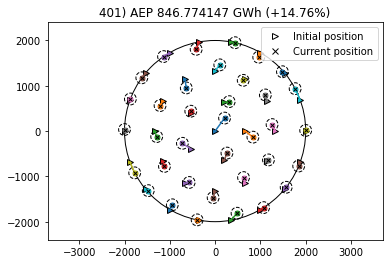

In [36]:
cost, state, recorder= optimize_iea37_locs(36, 16, EasyScipyOptimizeDriver(optimizer='SLSQP', maxiter=400 ,disp=False))

In [38]:
cost_36wt_slsqp, state_36wt_slsqp, recorder_36wt_slsqp = cost, state, recorder

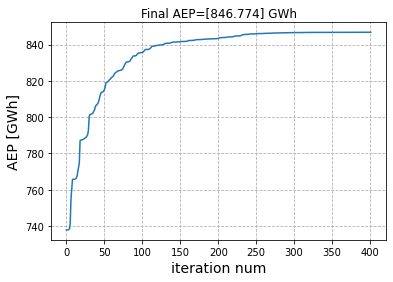

In [195]:
AEPs = recorder_36wt_slsqp.driver_iteration_dict['AEP']
plt.plot(AEPs)
plt.title(f'Final AEP={np.round(AEPs[-1],3)} GWh')
plt.grid(linestyle='--')
plt.ylabel('AEP [GWh]',fontsize=14)
plt.xlabel('iteration num',fontsize=14)
plt.show()

Calculate flow interaction: 100%|██████████| 64/64 [00:00<00:00, 2562.87wt/s]


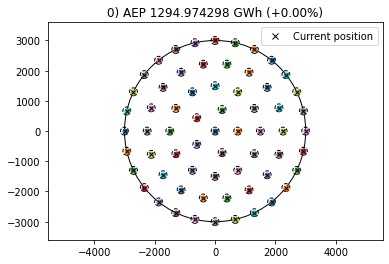

Calculate flow interaction: 100%|██████████| 64/64 [00:00<00:00, 1968.41wt/s]


Calculate flow interaction: 100%|██████████| 64/64 [00:00<00:00, 2195.65wt/s]


Calculate flow interaction: 100%|██████████| 64/64 [00:00<00:00, 1756.56wt/s]


Calculate flow interaction: 100%|██████████| 64/64 [00:00<00:00, 2105.08wt/s]


Calculate flow interaction: 100%|██████████| 64/64 [00:00<00:00, 1711.67wt/s]


Calculate flow interaction: 100%|██████████| 64/64 [00:00<00:00, 1109.24wt/s]


Calculate flow interaction: 100%|██████████| 64/64 [00:00<00:00, 1933.61wt/s]


Calculate flow interaction: 100%|██████████| 64/64 [00:00<00:00, 2002.49wt/s]


Calculate flow interaction: 100%|██████████| 64/64 [00:00<00:00, 2671.05wt/s]


Calculate flow interaction: 100%|██████████| 64/64 [00:00<00:00, 2794.05wt/s]


Calculate flow interaction: 100%|██████████| 64/64 [00:00<00:00, 2566.80wt/s]


Calculate flow interaction: 100%|██████████| 64/64 [00:00<00:00, 2212.95wt/s]


Calculate flow interaction: 100%|██████████| 64/64 [00:00<00:00, 2673.90wt/s]


Calculate flow interaction: 100%|██████████| 64/64 [00:00<00:00, 2790.56wt/s]


Calculate flow interaction: 100%|██████████| 64/64 [00:00<00:00, 2674.03wt/s]


Calculate flow interaction: 100%|██████████| 64/64 [00:00<00:00, 2669.96wt/s]


Calculate flow interaction: 100%|██████████| 64/64 [00:00<00:00, 2790.19wt/s]


Calculate flow interaction: 100%|██████████| 64/64 [00:00<00:00, 2670.10wt/s]


Calculate flow interaction: 100%|██████████| 64/64 [00:00<00:00, 2291.91wt/s]


Calculate flow interaction: 100%|██████████| 64/64 [00:00<00:00, 2790.13wt/s]


Calculate flow interaction: 100%|██████████| 64/64 [00:00<00:00, 2669.96wt/s]


Calculate flow interaction: 100%|██████████| 64/64 [00:00<00:00, 2793.99wt/s]


Calculate flow interaction: 100%|██████████| 64/64 [00:00<00:00, 2914.96wt/s]


Calculate flow interaction: 100%|██████████| 64/64 [00:00<00:00, 2568.81wt/s]


Calculate flow interaction: 100%|██████████| 64/64 [00:00<00:00, 2790.88wt/s]


Calculate flow interaction: 100%|██████████| 64/64 [00:00<00:00, 2294.32wt/s]


Calculate flow interaction: 100%|██████████| 64/64 [00:00<00:00, 3055.92wt/s]


Calculate flow interaction: 100%|██████████| 64/64 [00:00<00:00, 2005.39wt/s]


Calculate flow interaction: 100%|██████████| 64/64 [00:00<00:00, 2674.19wt/s]


Calculate flow interaction: 100%|██████████| 64/64 [00:00<00:00, 2916.73wt/s]


Calculate flow interaction: 100%|██████████| 64/64 [00:00<00:00, 3203.40wt/s]


Calculate flow interaction: 100%|██████████| 64/64 [00:00<00:00, 2917.36wt/s]


Calculate flow interaction: 100%|██████████| 64/64 [00:00<00:00, 3203.13wt/s]


Calculate flow interaction: 100%|██████████| 64/64 [00:00<00:00, 2911.92wt/s]


Calculate flow interaction: 100%|██████████| 64/64 [00:00<00:00, 3055.82wt/s]


Calculate flow interaction: 100%|██████████| 64/64 [00:00<00:00, 2790.13wt/s]


Calculate flow interaction: 100%|██████████| 64/64 [00:00<00:00, 2917.21wt/s]


Calculate flow interaction: 100%|██████████| 64/64 [00:00<00:00, 2790.07wt/s]


Calculate flow interaction: 100%|██████████| 64/64 [00:00<00:00, 2471.08wt/s]


Calculate flow interaction: 100%|██████████| 64/64 [00:00<00:00, 2915.27wt/s]


Calculate flow interaction: 100%|██████████| 64/64 [00:00<00:00, 2676.83wt/s]


Calculate flow interaction: 100%|██████████| 64/64 [00:00<00:00, 3213.95wt/s]


Calculate flow interaction: 100%|██████████| 64/64 [00:00<00:00, 3203.52wt/s]


Calculate flow interaction: 100%|██████████| 64/64 [00:00<00:00, 2794.14wt/s]


Calculate flow interaction: 100%|██████████| 64/64 [00:00<00:00, 3203.40wt/s]


Calculate flow interaction: 100%|██████████| 64/64 [00:00<00:00, 2911.73wt/s]


Calculate flow interaction: 100%|██████████| 64/64 [00:00<00:00, 3056.20wt/s]


Calculate flow interaction: 100%|██████████| 64/64 [00:00<00:00, 2915.91wt/s]


Calculate flow interaction: 100%|██████████| 64/64 [00:00<00:00, 3055.79wt/s]


Calculate flow interaction: 100%|██████████| 64/64 [00:00<00:00, 2921.40wt/s]


Calculate flow interaction: 100%|██████████| 64/64 [00:00<00:00, 2912.27wt/s]


Calculate flow interaction: 100%|██████████| 64/64 [00:00<00:00, 3051.30wt/s]


Calculate flow interaction: 100%|██████████| 64/64 [00:00<00:00, 2921.56wt/s]


Calculate flow interaction: 100%|██████████| 64/64 [00:00<00:00, 2916.51wt/s]


Calculate flow interaction: 100%|██████████| 64/64 [00:00<00:00, 3051.20wt/s]


Calculate flow interaction: 100%|██████████| 64/64 [00:00<00:00, 3056.93wt/s]


Calculate flow interaction: 100%|██████████| 64/64 [00:00<00:00, 3055.92wt/s]


Calculate flow interaction: 100%|██████████| 64/64 [00:00<00:00, 3208.61wt/s]


Calculate flow interaction: 100%|██████████| 64/64 [00:00<00:00, 2913.56wt/s]


Calculate flow interaction: 100%|██████████| 64/64 [00:00<00:00, 3056.20wt/s]


Calculate flow interaction: 100%|██████████| 64/64 [00:00<00:00, 3060.73wt/s]


Calculate flow interaction: 100%|██████████| 64/64 [00:00<00:00, 2212.81wt/s]


Calculate flow interaction: 100%|██████████| 64/64 [00:00<00:00, 3055.82wt/s]


Calculate flow interaction: 100%|██████████| 64/64 [00:00<00:00, 2917.21wt/s]


Calculate flow interaction: 100%|██████████| 64/64 [00:00<00:00, 3210.11wt/s]


Calculate flow interaction: 100%|██████████| 64/64 [00:00<00:00, 2791.75wt/s]


Calculate flow interaction: 100%|██████████| 64/64 [00:00<00:00, 2673.82wt/s]


Calculate flow interaction: 100%|██████████| 64/64 [00:00<00:00, 2790.10wt/s]


Calculate flow interaction: 100%|██████████| 64/64 [00:00<00:00, 3051.24wt/s]


Calculate flow interaction: 100%|██████████| 64/64 [00:00<00:00, 3051.24wt/s]


Calculate flow interaction: 100%|██████████| 64/64 [00:00<00:00, 2786.28wt/s]


Calculate flow interaction: 100%|██████████| 64/64 [00:00<00:00, 2673.87wt/s]


Calculate flow interaction: 100%|██████████| 64/64 [00:00<00:00, 2790.22wt/s]


Calculate flow interaction: 100%|██████████| 64/64 [00:00<00:00, 3051.27wt/s]


Calculate flow interaction: 100%|██████████| 64/64 [00:00<00:00, 2794.11wt/s]


Calculate flow interaction: 100%|██████████| 64/64 [00:00<00:00, 2921.36wt/s]


Calculate flow interaction: 100%|██████████| 64/64 [00:00<00:00, 2566.97wt/s]


Calculate flow interaction: 100%|██████████| 64/64 [00:00<00:00, 2789.75wt/s]


Calculate flow interaction: 100%|██████████| 64/64 [00:00<00:00, 2917.05wt/s]


Calculate flow interaction: 100%|██████████| 64/64 [00:00<00:00, 2917.33wt/s]


Calculate flow interaction: 100%|██████████| 64/64 [00:00<00:00, 2468.17wt/s]


Calculate flow interaction: 100%|██████████| 64/64 [00:00<00:00, 2566.92wt/s]


Calculate flow interaction: 100%|██████████| 64/64 [00:00<00:00, 2376.78wt/s]


Calculate flow interaction: 100%|██████████| 64/64 [00:00<00:00, 2376.73wt/s]


Calculate flow interaction: 100%|██████████| 64/64 [00:00<00:00, 2562.90wt/s]


Calculate flow interaction: 100%|██████████| 64/64 [00:00<00:00, 2671.29wt/s]


Calculate flow interaction: 100%|██████████| 64/64 [00:00<00:00, 3056.17wt/s]


Calculate flow interaction: 100%|██████████| 64/64 [00:00<00:00, 3060.59wt/s]


Calculate flow interaction: 100%|██████████| 64/64 [00:00<00:00, 3055.85wt/s]


Calculate flow interaction: 100%|██████████| 64/64 [00:00<00:00, 2789.81wt/s]


Calculate flow interaction: 100%|██████████| 64/64 [00:00<00:00, 3208.15wt/s]


Calculate flow interaction: 100%|██████████| 64/64 [00:00<00:00, 3055.79wt/s]


Calculate flow interaction: 100%|██████████| 64/64 [00:00<00:00, 2916.95wt/s]


Calculate flow interaction: 100%|██████████| 64/64 [00:00<00:00, 2562.87wt/s]


Calculate flow interaction: 100%|██████████| 64/64 [00:00<00:00, 2674.35wt/s]


Calculate flow interaction: 100%|██████████| 64/64 [00:00<00:00, 2912.30wt/s]


Calculate flow interaction: 100%|██████████| 64/64 [00:00<00:00, 2917.59wt/s]


Calculate flow interaction: 100%|██████████| 64/64 [00:00<00:00, 2212.68wt/s]


Calculate flow interaction: 100%|██████████| 64/64 [00:00<00:00, 2467.92wt/s]


Calculate flow interaction: 100%|██████████| 64/64 [00:00<00:00, 2912.14wt/s]


Calculate flow interaction: 100%|██████████| 64/64 [00:00<00:00, 2675.98wt/s]


Calculate flow interaction: 100%|██████████| 64/64 [00:00<00:00, 3050.82wt/s]


Calculate flow interaction: 100%|██████████| 64/64 [00:00<00:00, 2791.52wt/s]


Calculate flow interaction: 100%|██████████| 64/64 [00:00<00:00, 3051.10wt/s]


Calculate flow interaction: 100%|██████████| 64/64 [00:00<00:00, 3050.68wt/s]


Calculate flow interaction: 100%|██████████| 64/64 [00:00<00:00, 2563.54wt/s]


Calculate flow interaction: 100%|██████████| 64/64 [00:00<00:00, 2912.84wt/s]


Calculate flow interaction: 100%|██████████| 64/64 [00:00<00:00, 2920.19wt/s]


Calculate flow interaction: 100%|██████████| 64/64 [00:00<00:00, 2785.90wt/s]


Calculate flow interaction: 100%|██████████| 64/64 [00:00<00:00, 2465.06wt/s]


Calculate flow interaction: 100%|██████████| 64/64 [00:00<00:00, 2563.27wt/s]


Calculate flow interaction: 100%|██████████| 64/64 [00:00<00:00, 2673.63wt/s]


Calculate flow interaction: 100%|██████████| 64/64 [00:00<00:00, 2468.08wt/s]


Calculate flow interaction: 100%|██████████| 64/64 [00:00<00:00, 2468.53wt/s]


Calculate flow interaction: 100%|██████████| 64/64 [00:00<00:00, 2685.62wt/s]


Calculate flow interaction: 100%|██████████| 64/64 [00:00<00:00, 2291.70wt/s]


Calculate flow interaction: 100%|██████████| 64/64 [00:00<00:00, 2374.00wt/s]


Calculate flow interaction: 100%|██████████| 64/64 [00:00<00:00, 3052.07wt/s]


Calculate flow interaction: 100%|██████████| 64/64 [00:00<00:00, 3052.55wt/s]


Calculate flow interaction: 100%|██████████| 64/64 [00:00<00:00, 2916.67wt/s]


Calculate flow interaction: 100%|██████████| 64/64 [00:00<00:00, 2921.36wt/s]


Calculate flow interaction: 100%|██████████| 64/64 [00:00<00:00, 3055.96wt/s]


Calculate flow interaction: 100%|██████████| 64/64 [00:00<00:00, 2912.52wt/s]


Calculate flow interaction: 100%|██████████| 64/64 [00:00<00:00, 3061.61wt/s]


Calculate flow interaction: 100%|██████████| 64/64 [00:00<00:00, 2673.87wt/s]


Calculate flow interaction: 100%|██████████| 64/64 [00:00<00:00, 3208.49wt/s]


Calculate flow interaction: 100%|██████████| 64/64 [00:00<00:00, 2790.13wt/s]


Calculate flow interaction: 100%|██████████| 64/64 [00:00<00:00, 2916.98wt/s]


Calculate flow interaction: 100%|██████████| 64/64 [00:00<00:00, 3051.13wt/s]


Calculate flow interaction: 100%|██████████| 64/64 [00:00<00:00, 2673.79wt/s]


Calculate flow interaction: 100%|██████████| 64/64 [00:00<00:00, 3003.24wt/s]


Calculate flow interaction: 100%|██████████| 64/64 [00:00<00:00, 2566.82wt/s]


Calculate flow interaction: 100%|██████████| 64/64 [00:00<00:00, 3056.55wt/s]


Calculate flow interaction: 100%|██████████| 64/64 [00:00<00:00, 2916.92wt/s]


Calculate flow interaction: 100%|██████████| 64/64 [00:00<00:00, 2673.61wt/s]


Calculate flow interaction: 100%|██████████| 64/64 [00:00<00:00, 2212.73wt/s]


Calculate flow interaction: 100%|██████████| 64/64 [00:00<00:00, 2916.95wt/s]


Calculate flow interaction: 100%|██████████| 64/64 [00:00<00:00, 2563.09wt/s]


Calculate flow interaction: 100%|██████████| 64/64 [00:00<00:00, 2789.84wt/s]


Calculate flow interaction: 100%|██████████| 64/64 [00:00<00:00, 2291.05wt/s]


Calculate flow interaction: 100%|██████████| 64/64 [00:00<00:00, 2669.30wt/s]


Calculate flow interaction: 100%|██████████| 64/64 [00:00<00:00, 2566.87wt/s]


Calculate flow interaction: 100%|██████████| 64/64 [00:00<00:00, 3050.82wt/s]


Calculate flow interaction: 100%|██████████| 64/64 [00:00<00:00, 3055.02wt/s]


Calculate flow interaction: 100%|██████████| 64/64 [00:00<00:00, 3055.82wt/s]


Calculate flow interaction: 100%|██████████| 64/64 [00:00<00:00, 2914.29wt/s]


Calculate flow interaction: 100%|██████████| 64/64 [00:00<00:00, 2464.68wt/s]


Calculate flow interaction: 100%|██████████| 64/64 [00:00<00:00, 2563.07wt/s]


Calculate flow interaction: 100%|██████████| 64/64 [00:00<00:00, 2563.36wt/s]


Calculate flow interaction: 100%|██████████| 64/64 [00:00<00:00, 2785.96wt/s]


Calculate flow interaction: 100%|██████████| 64/64 [00:00<00:00, 2376.63wt/s]


Calculate flow interaction: 100%|██████████| 64/64 [00:00<00:00, 1125.75wt/s]


Calculate flow interaction: 100%|██████████| 64/64 [00:00<00:00, 3057.56wt/s]


Calculate flow interaction: 100%|██████████| 64/64 [00:00<00:00, 3050.75wt/s]


Calculate flow interaction: 100%|██████████| 64/64 [00:00<00:00, 2912.58wt/s]


Calculate flow interaction: 100%|██████████| 64/64 [00:00<00:00, 2469.94wt/s]


Calculate flow interaction: 100%|██████████| 64/64 [00:00<00:00, 2141.52wt/s]


Calculate flow interaction: 100%|██████████| 64/64 [00:00<00:00, 2139.10wt/s]


Calculate flow interaction: 100%|██████████| 64/64 [00:00<00:00, 2916.79wt/s]


Calculate flow interaction: 100%|██████████| 64/64 [00:00<00:00, 2673.47wt/s]


Calculate flow interaction: 100%|██████████| 64/64 [00:00<00:00, 2916.98wt/s]


Calculate flow interaction: 100%|██████████| 64/64 [00:00<00:00, 2376.65wt/s]


Calculate flow interaction: 100%|██████████| 64/64 [00:00<00:00, 2676.73wt/s]


Calculate flow interaction: 100%|██████████| 64/64 [00:00<00:00, 2669.91wt/s]


Calculate flow interaction: 100%|██████████| 64/64 [00:00<00:00, 2794.75wt/s]


Calculate flow interaction: 100%|██████████| 64/64 [00:00<00:00, 2911.76wt/s]


Calculate flow interaction: 100%|██████████| 64/64 [00:00<00:00, 2677.47wt/s]


Calculate flow interaction: 100%|██████████| 64/64 [00:00<00:00, 2139.10wt/s]


Calculate flow interaction: 100%|██████████| 64/64 [00:00<00:00, 2678.65wt/s]


Calculate flow interaction: 100%|██████████| 64/64 [00:00<00:00, 2790.01wt/s]


Calculate flow interaction: 100%|██████████| 64/64 [00:00<00:00, 2466.35wt/s]


Calculate flow interaction: 100%|██████████| 64/64 [00:00<00:00, 2468.24wt/s]


Calculate flow interaction: 100%|██████████| 64/64 [00:00<00:00, 2291.79wt/s]


Calculate flow interaction: 100%|██████████| 64/64 [00:00<00:00, 2916.83wt/s]


Calculate flow interaction: 100%|██████████| 64/64 [00:00<00:00, 2568.86wt/s]


Calculate flow interaction: 100%|██████████| 64/64 [00:00<00:00, 3054.08wt/s]


Calculate flow interaction: 100%|██████████| 64/64 [00:00<00:00, 2465.06wt/s]


Calculate flow interaction: 100%|██████████| 64/64 [00:00<00:00, 3055.79wt/s]


Calculate flow interaction: 100%|██████████| 64/64 [00:00<00:00, 2292.24wt/s]


Calculate flow interaction: 100%|██████████| 64/64 [00:00<00:00, 2464.97wt/s]


Calculate flow interaction: 100%|██████████| 64/64 [00:00<00:00, 2289.17wt/s]


Calculate flow interaction: 100%|██████████| 64/64 [00:00<00:00, 3208.65wt/s]


Calculate flow interaction: 100%|██████████| 64/64 [00:00<00:00, 2791.90wt/s]


Calculate flow interaction: 100%|██████████| 64/64 [00:00<00:00, 2786.31wt/s]


Calculate flow interaction: 100%|██████████| 64/64 [00:00<00:00, 3051.34wt/s]


Calculate flow interaction: 100%|██████████| 64/64 [00:00<00:00, 2794.51wt/s]


Calculate flow interaction: 100%|██████████| 64/64 [00:00<00:00, 2139.17wt/s]


Calculate flow interaction: 100%|██████████| 64/64 [00:00<00:00, 3213.60wt/s]


Calculate flow interaction: 100%|██████████| 64/64 [00:00<00:00, 3051.30wt/s]


Calculate flow interaction: 100%|██████████| 64/64 [00:00<00:00, 3203.48wt/s]


Calculate flow interaction: 100%|██████████| 64/64 [00:00<00:00, 3050.99wt/s]


Calculate flow interaction: 100%|██████████| 64/64 [00:00<00:00, 2917.11wt/s]


Calculate flow interaction: 100%|██████████| 64/64 [00:00<00:00, 2921.36wt/s]


Calculate flow interaction: 100%|██████████| 64/64 [00:00<00:00, 2789.75wt/s]


Calculate flow interaction: 100%|██████████| 64/64 [00:00<00:00, 2291.85wt/s]


Calculate flow interaction: 100%|██████████| 64/64 [00:00<00:00, 2670.95wt/s]


Calculate flow interaction: 100%|██████████| 64/64 [00:00<00:00, 2563.63wt/s]


Calculate flow interaction: 100%|██████████| 64/64 [00:00<00:00, 2563.61wt/s]


Calculate flow interaction: 100%|██████████| 64/64 [00:00<00:00, 3050.96wt/s]


Calculate flow interaction: 100%|██████████| 64/64 [00:00<00:00, 2786.07wt/s]


Calculate flow interaction: 100%|██████████| 64/64 [00:00<00:00, 3051.27wt/s]


Calculate flow interaction: 100%|██████████| 64/64 [00:00<00:00, 2789.78wt/s]


Calculate flow interaction: 100%|██████████| 64/64 [00:00<00:00, 2563.56wt/s]


Calculate flow interaction: 100%|██████████| 64/64 [00:00<00:00, 3208.65wt/s]


Calculate flow interaction: 100%|██████████| 64/64 [00:00<00:00, 2921.33wt/s]


Calculate flow interaction: 100%|██████████| 64/64 [00:00<00:00, 2673.90wt/s]


Calculate flow interaction: 100%|██████████| 64/64 [00:00<00:00, 2911.92wt/s]


Calculate flow interaction: 100%|██████████| 64/64 [00:00<00:00, 2136.65wt/s]


Calculate flow interaction: 100%|██████████| 64/64 [00:00<00:00, 2793.90wt/s]


Calculate flow interaction: 100%|██████████| 64/64 [00:00<00:00, 2911.73wt/s]


Calculate flow interaction: 100%|██████████| 64/64 [00:00<00:00, 3051.27wt/s]


Calculate flow interaction: 100%|██████████| 64/64 [00:00<00:00, 2918.89wt/s]


Calculate flow interaction: 100%|██████████| 64/64 [00:00<00:00, 3055.99wt/s]


Calculate flow interaction: 100%|██████████| 64/64 [00:00<00:00, 3205.58wt/s]


Calculate flow interaction: 100%|██████████| 64/64 [00:00<00:00, 3056.06wt/s]


Calculate flow interaction: 100%|██████████| 64/64 [00:00<00:00, 2916.70wt/s]


Calculate flow interaction: 100%|██████████| 64/64 [00:00<00:00, 3055.79wt/s]


Calculate flow interaction: 100%|██████████| 64/64 [00:00<00:00, 3052.00wt/s]


Calculate flow interaction: 100%|██████████| 64/64 [00:00<00:00, 2916.95wt/s]


Calculate flow interaction: 100%|██████████| 64/64 [00:00<00:00, 3050.78wt/s]


Calculate flow interaction: 100%|██████████| 64/64 [00:00<00:00, 3050.65wt/s]


Calculate flow interaction: 100%|██████████| 64/64 [00:00<00:00, 3063.28wt/s]


Calculate flow interaction: 100%|██████████| 64/64 [00:00<00:00, 3050.44wt/s]


Calculate flow interaction: 100%|██████████| 64/64 [00:00<00:00, 2916.95wt/s]


Calculate flow interaction: 100%|██████████| 64/64 [00:00<00:00, 2917.14wt/s]


Calculate flow interaction: 100%|██████████| 64/64 [00:00<00:00, 3060.59wt/s]


Calculate flow interaction: 100%|██████████| 64/64 [00:00<00:00, 3060.00wt/s]


Calculate flow interaction: 100%|██████████| 64/64 [00:00<00:00, 3055.47wt/s]


Calculate flow interaction: 100%|██████████| 64/64 [00:00<00:00, 3056.03wt/s]


Calculate flow interaction: 100%|██████████| 64/64 [00:00<00:00, 2566.89wt/s]


Calculate flow interaction: 100%|██████████| 64/64 [00:00<00:00, 3055.89wt/s]


Calculate flow interaction: 100%|██████████| 64/64 [00:00<00:00, 3050.89wt/s]


Calculate flow interaction: 100%|██████████| 64/64 [00:00<00:00, 3055.40wt/s]


Calculate flow interaction: 100%|██████████| 64/64 [00:00<00:00, 3208.65wt/s]


Calculate flow interaction: 100%|██████████| 64/64 [00:00<00:00, 2916.45wt/s]


Calculate flow interaction: 100%|██████████| 64/64 [00:00<00:00, 2921.33wt/s]


Calculate flow interaction: 100%|██████████| 64/64 [00:00<00:00, 2916.95wt/s]


Calculate flow interaction: 100%|██████████| 64/64 [00:00<00:00, 3055.85wt/s]


Calculate flow interaction: 100%|██████████| 64/64 [00:00<00:00, 2917.21wt/s]


Calculate flow interaction: 100%|██████████| 64/64 [00:00<00:00, 2916.64wt/s]


Calculate flow interaction: 100%|██████████| 64/64 [00:00<00:00, 3059.62wt/s]


Calculate flow interaction: 100%|██████████| 64/64 [00:00<00:00, 3051.17wt/s]


Calculate flow interaction: 100%|██████████| 64/64 [00:00<00:00, 2916.92wt/s]


Calculate flow interaction: 100%|██████████| 64/64 [00:00<00:00, 2563.05wt/s]


Calculate flow interaction: 100%|██████████| 64/64 [00:00<00:00, 2005.33wt/s]


Calculate flow interaction: 100%|██████████| 64/64 [00:00<00:00, 2376.86wt/s]


Calculate flow interaction: 100%|██████████| 64/64 [00:00<00:00, 2794.22wt/s]


Calculate flow interaction: 100%|██████████| 64/64 [00:00<00:00, 1492.33wt/s]


Calculate flow interaction: 100%|██████████| 64/64 [00:00<00:00, 2669.99wt/s]


Calculate flow interaction: 100%|██████████| 64/64 [00:00<00:00, 2670.26wt/s]


Calculate flow interaction: 100%|██████████| 64/64 [00:00<00:00, 2677.74wt/s]


Calculate flow interaction: 100%|██████████| 64/64 [00:00<00:00, 2916.92wt/s]


Calculate flow interaction: 100%|██████████| 64/64 [00:00<00:00, 2378.17wt/s]


Calculate flow interaction: 100%|██████████| 64/64 [00:00<00:00, 2468.12wt/s]


Calculate flow interaction: 100%|██████████| 64/64 [00:00<00:00, 2673.87wt/s]


Calculate flow interaction: 100%|██████████| 64/64 [00:00<00:00, 2912.49wt/s]


Calculate flow interaction: 100%|██████████| 64/64 [00:00<00:00, 2916.89wt/s]


Calculate flow interaction: 100%|██████████| 64/64 [00:00<00:00, 2794.08wt/s]


Calculate flow interaction: 100%|██████████| 64/64 [00:00<00:00, 2912.36wt/s]


Calculate flow interaction: 100%|██████████| 64/64 [00:00<00:00, 1944.54wt/s]


Calculate flow interaction: 100%|██████████| 64/64 [00:00<00:00, 2212.77wt/s]


Calculate flow interaction: 100%|██████████| 64/64 [00:00<00:00, 2291.79wt/s]


Calculate flow interaction: 100%|██████████| 64/64 [00:00<00:00, 2566.84wt/s]


Calculate flow interaction: 100%|██████████| 64/64 [00:00<00:00, 2569.72wt/s]


Calculate flow interaction: 100%|██████████| 64/64 [00:00<00:00, 2376.61wt/s]


Calculate flow interaction: 100%|██████████| 64/64 [00:00<00:00, 2673.87wt/s]


Calculate flow interaction: 100%|██████████| 64/64 [00:00<00:00, 3061.54wt/s]


Calculate flow interaction: 100%|██████████| 64/64 [00:00<00:00, 2673.90wt/s]


Calculate flow interaction: 100%|██████████| 64/64 [00:00<00:00, 2916.79wt/s]


Calculate flow interaction: 100%|██████████| 64/64 [00:00<00:00, 2916.45wt/s]


Calculate flow interaction: 100%|██████████| 64/64 [00:00<00:00, 2789.78wt/s]


Calculate flow interaction: 100%|██████████| 64/64 [00:00<00:00, 2789.72wt/s]


Calculate flow interaction: 100%|██████████| 64/64 [00:00<00:00, 2788.39wt/s]


Calculate flow interaction: 100%|██████████| 64/64 [00:00<00:00, 2677.61wt/s]


Calculate flow interaction: 100%|██████████| 64/64 [00:00<00:00, 2790.01wt/s]


Calculate flow interaction: 100%|██████████| 64/64 [00:00<00:00, 2794.25wt/s]


Calculate flow interaction: 100%|██████████| 64/64 [00:00<00:00, 3060.14wt/s]


Calculate flow interaction: 100%|██████████| 64/64 [00:00<00:00, 3055.89wt/s]


Calculate flow interaction: 100%|██████████| 64/64 [00:00<00:00, 3055.85wt/s]


Calculate flow interaction: 100%|██████████| 64/64 [00:00<00:00, 3205.47wt/s]


Calculate flow interaction: 100%|██████████| 64/64 [00:00<00:00, 3055.75wt/s]


Calculate flow interaction: 100%|██████████| 64/64 [00:00<00:00, 2915.88wt/s]


Calculate flow interaction: 100%|██████████| 64/64 [00:00<00:00, 2467.15wt/s]


Calculate flow interaction: 100%|██████████| 64/64 [00:00<00:00, 2790.04wt/s]


Calculate flow interaction: 100%|██████████| 64/64 [00:00<00:00, 2794.49wt/s]


Calculate flow interaction: 100%|██████████| 64/64 [00:00<00:00, 2921.43wt/s]


Calculate flow interaction: 100%|██████████| 64/64 [00:00<00:00, 2570.29wt/s]


Calculate flow interaction: 100%|██████████| 64/64 [00:00<00:00, 2069.97wt/s]


Calculate flow interaction: 100%|██████████| 64/64 [00:00<00:00, 2289.35wt/s]


Calculate flow interaction: 100%|██████████| 64/64 [00:00<00:00, 2215.60wt/s]


Calculate flow interaction: 100%|██████████| 64/64 [00:00<00:00, 2566.97wt/s]


Calculate flow interaction: 100%|██████████| 64/64 [00:00<00:00, 2790.94wt/s]


Calculate flow interaction: 100%|██████████| 64/64 [00:00<00:00, 2677.93wt/s]


Calculate flow interaction: 100%|██████████| 64/64 [00:00<00:00, 2674.46wt/s]


Calculate flow interaction: 100%|██████████| 64/64 [00:00<00:00, 2673.69wt/s]


Calculate flow interaction: 100%|██████████| 64/64 [00:00<00:00, 3061.26wt/s]


Calculate flow interaction: 100%|██████████| 64/64 [00:00<00:00, 2921.33wt/s]


Calculate flow interaction: 100%|██████████| 64/64 [00:00<00:00, 2790.04wt/s]


Calculate flow interaction: 100%|██████████| 64/64 [00:00<00:00, 2674.91wt/s]


Calculate flow interaction: 100%|██████████| 64/64 [00:00<00:00, 2790.10wt/s]


Calculate flow interaction: 100%|██████████| 64/64 [00:00<00:00, 2790.16wt/s]


Calculate flow interaction: 100%|██████████| 64/64 [00:00<00:00, 2567.02wt/s]


Calculate flow interaction: 100%|██████████| 64/64 [00:00<00:00, 2376.73wt/s]


Calculate flow interaction: 100%|██████████| 64/64 [00:00<00:00, 2673.85wt/s]


Calculate flow interaction: 100%|██████████| 64/64 [00:00<00:00, 2921.33wt/s]


Calculate flow interaction: 100%|██████████| 64/64 [00:00<00:00, 2676.75wt/s]


Calculate flow interaction: 100%|██████████| 64/64 [00:00<00:00, 2673.87wt/s]


Calculate flow interaction: 100%|██████████| 64/64 [00:00<00:00, 2674.01wt/s]


Calculate flow interaction: 100%|██████████| 64/64 [00:00<00:00, 2563.17wt/s]


Calculate flow interaction: 100%|██████████| 64/64 [00:00<00:00, 2567.04wt/s]


Calculate flow interaction: 100%|██████████| 64/64 [00:00<00:00, 2376.80wt/s]


Calculate flow interaction: 100%|██████████| 64/64 [00:00<00:00, 2670.44wt/s]


Calculate flow interaction: 100%|██████████| 64/64 [00:00<00:00, 2921.46wt/s]


Calculate flow interaction: 100%|██████████| 64/64 [00:00<00:00, 2674.97wt/s]


Calculate flow interaction: 100%|██████████| 64/64 [00:00<00:00, 2677.45wt/s]


Calculate flow interaction: 100%|██████████| 64/64 [00:00<00:00, 2677.45wt/s]


Calculate flow interaction: 100%|██████████| 64/64 [00:00<00:00, 2675.10wt/s]


Calculate flow interaction: 100%|██████████| 64/64 [00:00<00:00, 2570.19wt/s]


Calculate flow interaction: 100%|██████████| 64/64 [00:00<00:00, 3206.42wt/s]


Calculate flow interaction: 100%|██████████| 64/64 [00:00<00:00, 2670.02wt/s]


Calculate flow interaction: 100%|██████████| 64/64 [00:00<00:00, 2468.15wt/s]


Calculate flow interaction: 100%|██████████| 64/64 [00:00<00:00, 2139.01wt/s]


Calculate flow interaction: 100%|██████████| 64/64 [00:00<00:00, 2673.79wt/s]


Calculate flow interaction: 100%|██████████| 64/64 [00:00<00:00, 2138.64wt/s]


Calculate flow interaction: 100%|██████████| 64/64 [00:00<00:00, 2291.89wt/s]


Calculate flow interaction: 100%|██████████| 64/64 [00:00<00:00, 2468.10wt/s]


Calculate flow interaction: 100%|██████████| 64/64 [00:00<00:00, 2789.95wt/s]


Calculate flow interaction: 100%|██████████| 64/64 [00:00<00:00, 2790.30wt/s]


Calculate flow interaction: 100%|██████████| 64/64 [00:00<00:00, 3051.13wt/s]


Calculate flow interaction: 100%|██████████| 64/64 [00:00<00:00, 2912.62wt/s]


Calculate flow interaction: 100%|██████████| 64/64 [00:00<00:00, 2673.93wt/s]


Calculate flow interaction: 100%|██████████| 64/64 [00:00<00:00, 2570.88wt/s]


Calculate flow interaction: 100%|██████████| 64/64 [00:00<00:00, 2569.40wt/s]


Calculate flow interaction: 100%|██████████| 64/64 [00:00<00:00, 2673.74wt/s]


Calculate flow interaction: 100%|██████████| 64/64 [00:00<00:00, 2673.90wt/s]


Calculate flow interaction: 100%|██████████| 64/64 [00:00<00:00, 2790.04wt/s]


Calculate flow interaction: 100%|██████████| 64/64 [00:00<00:00, 2569.87wt/s]


Calculate flow interaction: 100%|██████████| 64/64 [00:00<00:00, 2790.36wt/s]


Calculate flow interaction: 100%|██████████| 64/64 [00:00<00:00, 2673.82wt/s]


Calculate flow interaction: 100%|██████████| 64/64 [00:00<00:00, 2673.61wt/s]


Calculate flow interaction: 100%|██████████| 64/64 [00:00<00:00, 2917.08wt/s]


Calculate flow interaction: 100%|██████████| 64/64 [00:00<00:00, 3055.51wt/s]


Calculate flow interaction: 100%|██████████| 64/64 [00:00<00:00, 2674.01wt/s]


Calculate flow interaction: 100%|██████████| 64/64 [00:00<00:00, 3055.75wt/s]


Calculate flow interaction: 100%|██████████| 64/64 [00:00<00:00, 2912.27wt/s]


Calculate flow interaction: 100%|██████████| 64/64 [00:00<00:00, 2570.31wt/s]


Calculate flow interaction: 100%|██████████| 64/64 [00:00<00:00, 2673.74wt/s]


Calculate flow interaction: 100%|██████████| 64/64 [00:00<00:00, 2569.38wt/s]


Calculate flow interaction: 100%|██████████| 64/64 [00:00<00:00, 2793.21wt/s]


Calculate flow interaction: 100%|██████████| 64/64 [00:00<00:00, 2212.84wt/s]


Calculate flow interaction: 100%|██████████| 64/64 [00:00<00:00, 2566.77wt/s]


Calculate flow interaction: 100%|██████████| 64/64 [00:00<00:00, 2790.04wt/s]


Calculate flow interaction: 100%|██████████| 64/64 [00:00<00:00, 2789.23wt/s]


Calculate flow interaction: 100%|██████████| 64/64 [00:00<00:00, 2785.81wt/s]


Calculate flow interaction: 100%|██████████| 64/64 [00:00<00:00, 2673.69wt/s]


Calculate flow interaction: 100%|██████████| 64/64 [00:00<00:00, 2376.75wt/s]


Calculate flow interaction: 100%|██████████| 64/64 [00:00<00:00, 2468.03wt/s]


Calculate flow interaction: 100%|██████████| 64/64 [00:00<00:00, 2566.82wt/s]


Calculate flow interaction: 100%|██████████| 64/64 [00:00<00:00, 2793.21wt/s]


Calculate flow interaction: 100%|██████████| 64/64 [00:00<00:00, 2794.46wt/s]


Calculate flow interaction: 100%|██████████| 64/64 [00:00<00:00, 2786.07wt/s]


Calculate flow interaction: 100%|██████████| 64/64 [00:00<00:00, 2468.10wt/s]


Calculate flow interaction: 100%|██████████| 64/64 [00:00<00:00, 2673.53wt/s]


Calculate flow interaction: 100%|██████████| 64/64 [00:00<00:00, 2669.46wt/s]


Calculate flow interaction: 100%|██████████| 64/64 [00:00<00:00, 2677.74wt/s]


Calculate flow interaction: 100%|██████████| 64/64 [00:00<00:00, 2673.77wt/s]


Calculate flow interaction: 100%|██████████| 64/64 [00:00<00:00, 2670.04wt/s]


Calculate flow interaction: 100%|██████████| 64/64 [00:00<00:00, 2670.26wt/s]


Calculate flow interaction: 100%|██████████| 64/64 [00:00<00:00, 2917.87wt/s]


Calculate flow interaction: 100%|██████████| 64/64 [00:00<00:00, 2787.12wt/s]


Calculate flow interaction: 100%|██████████| 64/64 [00:00<00:00, 2916.57wt/s]


Calculate flow interaction: 100%|██████████| 64/64 [00:00<00:00, 3055.85wt/s]


Calculate flow interaction: 100%|██████████| 64/64 [00:00<00:00, 3055.85wt/s]


Calculate flow interaction: 100%|██████████| 64/64 [00:00<00:00, 2913.28wt/s]


Calculate flow interaction: 100%|██████████| 64/64 [00:00<00:00, 3205.62wt/s]


Calculate flow interaction: 100%|██████████| 64/64 [00:00<00:00, 3053.84wt/s]


Calculate flow interaction: 100%|██████████| 64/64 [00:00<00:00, 2912.58wt/s]


Calculate flow interaction: 100%|██████████| 64/64 [00:00<00:00, 2916.89wt/s]


Calculate flow interaction: 100%|██████████| 64/64 [00:00<00:00, 2669.94wt/s]


Calculate flow interaction: 100%|██████████| 64/64 [00:00<00:00, 3208.65wt/s]


Calculate flow interaction: 100%|██████████| 64/64 [00:00<00:00, 3055.82wt/s]


Calculate flow interaction: 100%|██████████| 64/64 [00:00<00:00, 2786.94wt/s]


Calculate flow interaction: 100%|██████████| 64/64 [00:00<00:00, 3055.16wt/s]


Calculate flow interaction: 100%|██████████| 64/64 [00:00<00:00, 3211.10wt/s]


Calculate flow interaction: 100%|██████████| 64/64 [00:00<00:00, 3055.82wt/s]


Calculate flow interaction: 100%|██████████| 64/64 [00:00<00:00, 2566.84wt/s]


Calculate flow interaction: 100%|██████████| 64/64 [00:00<00:00, 3056.52wt/s]


Calculate flow interaction: 100%|██████████| 64/64 [00:00<00:00, 2673.85wt/s]


Calculate flow interaction: 100%|██████████| 64/64 [00:00<00:00, 2673.74wt/s]


Calculate flow interaction: 100%|██████████| 64/64 [00:00<00:00, 2916.54wt/s]


Calculate flow interaction: 100%|██████████| 64/64 [00:00<00:00, 2468.12wt/s]


Calculate flow interaction: 100%|██████████| 64/64 [00:00<00:00, 3050.68wt/s]


Calculate flow interaction: 100%|██████████| 64/64 [00:00<00:00, 2468.21wt/s]


Calculate flow interaction: 100%|██████████| 64/64 [00:00<00:00, 3055.65wt/s]


Calculate flow interaction: 100%|██████████| 64/64 [00:00<00:00, 2785.96wt/s]


Calculate flow interaction: 100%|██████████| 64/64 [00:00<00:00, 2570.19wt/s]


Calculate flow interaction: 100%|██████████| 64/64 [00:00<00:00, 2291.77wt/s]


Calculate flow interaction: 100%|██████████| 64/64 [00:00<00:00, 2376.80wt/s]


Calculate flow interaction: 100%|██████████| 64/64 [00:00<00:00, 3056.59wt/s]


Calculate flow interaction: 100%|██████████| 64/64 [00:00<00:00, 3060.84wt/s]


Calculate flow interaction: 100%|██████████| 64/64 [00:00<00:00, 2917.02wt/s]


Calculate flow interaction: 100%|██████████| 64/64 [00:00<00:00, 2564.12wt/s]


Calculate flow interaction: 100%|██████████| 64/64 [00:00<00:00, 3049.64wt/s]


Calculate flow interaction: 100%|██████████| 64/64 [00:00<00:00, 2914.17wt/s]


Calculate flow interaction: 100%|██████████| 64/64 [00:00<00:00, 2917.02wt/s]


Calculate flow interaction: 100%|██████████| 64/64 [00:00<00:00, 2376.69wt/s]


Calculate flow interaction: 100%|██████████| 64/64 [00:00<00:00, 2917.90wt/s]


Calculate flow interaction: 100%|██████████| 64/64 [00:00<00:00, 3050.71wt/s]


Calculate flow interaction: 100%|██████████| 64/64 [00:00<00:00, 2291.87wt/s]


Calculate flow interaction: 100%|██████████| 64/64 [00:00<00:00, 3205.01wt/s]


Calculate flow interaction: 100%|██████████| 64/64 [00:00<00:00, 1833.49wt/s]


Calculate flow interaction: 100%|██████████| 64/64 [00:00<00:00, 2916.92wt/s]


Calculate flow interaction: 100%|██████████| 64/64 [00:00<00:00, 1563.84wt/s]


Calculate flow interaction: 100%|██████████| 64/64 [00:00<00:00, 2329.68wt/s]


Calculate flow interaction: 100%|██████████| 64/64 [00:00<00:00, 2729.69wt/s]


Calculate flow interaction: 100%|██████████| 64/64 [00:00<00:00, 2790.07wt/s]


Calculate flow interaction: 100%|██████████| 64/64 [00:00<00:00, 2789.98wt/s]


Calculate flow interaction: 100%|██████████| 64/64 [00:00<00:00, 2794.43wt/s]


Calculate flow interaction: 100%|██████████| 64/64 [00:00<00:00, 2570.31wt/s]


Calculate flow interaction: 100%|██████████| 64/64 [00:00<00:00, 2912.62wt/s]


Calculate flow interaction: 100%|██████████| 64/64 [00:00<00:00, 2916.95wt/s]


Calculate flow interaction: 100%|██████████| 64/64 [00:00<00:00, 3061.88wt/s]


Calculate flow interaction: 100%|██████████| 64/64 [00:00<00:00, 3055.85wt/s]


Calculate flow interaction: 100%|██████████| 64/64 [00:00<00:00, 3056.76wt/s]


Calculate flow interaction: 100%|██████████| 64/64 [00:00<00:00, 2468.30wt/s]


Calculate flow interaction: 100%|██████████| 64/64 [00:00<00:00, 3060.80wt/s]


Calculate flow interaction: 100%|██████████| 64/64 [00:00<00:00, 3052.00wt/s]


Calculate flow interaction: 100%|██████████| 64/64 [00:00<00:00, 2786.28wt/s]


Calculate flow interaction: 100%|██████████| 64/64 [00:00<00:00, 3055.82wt/s]


Calculate flow interaction: 100%|██████████| 64/64 [00:00<00:00, 3055.44wt/s]


Calculate flow interaction: 100%|██████████| 64/64 [00:00<00:00, 2677.61wt/s]


Calculate flow interaction: 100%|██████████| 64/64 [00:00<00:00, 2377.32wt/s]


Calculate flow interaction: 100%|██████████| 64/64 [00:00<00:00, 2294.63wt/s]


Calculate flow interaction: 100%|██████████| 64/64 [00:00<00:00, 2671.24wt/s]


Calculate flow interaction: 100%|██████████| 64/64 [00:00<00:00, 2375.66wt/s]


Calculate flow interaction: 100%|██████████| 64/64 [00:00<00:00, 2566.87wt/s]


Calculate flow interaction: 100%|██████████| 64/64 [00:00<00:00, 2216.19wt/s]


Calculate flow interaction: 100%|██████████| 64/64 [00:00<00:00, 2468.44wt/s]


Calculate flow interaction: 100%|██████████| 64/64 [00:00<00:00, 2210.33wt/s]


Calculate flow interaction: 100%|██████████| 64/64 [00:00<00:00, 2790.04wt/s]


Calculate flow interaction: 100%|██████████| 64/64 [00:00<00:00, 2790.04wt/s]


Calculate flow interaction: 100%|██████████| 64/64 [00:00<00:00, 2790.10wt/s]


Calculate flow interaction: 100%|██████████| 64/64 [00:00<00:00, 2291.75wt/s]


Calculate flow interaction: 100%|██████████| 64/64 [00:00<00:00, 2212.42wt/s]


Calculate flow interaction: 100%|██████████| 64/64 [00:00<00:00, 2291.89wt/s]


Calculate flow interaction: 100%|██████████| 64/64 [00:00<00:00, 2678.17wt/s]


Calculate flow interaction: 100%|██████████| 64/64 [00:00<00:00, 2790.51wt/s]


Calculate flow interaction: 100%|██████████| 64/64 [00:00<00:00, 2677.63wt/s]


Calculate flow interaction: 100%|██████████| 64/64 [00:00<00:00, 2789.37wt/s]


Calculate flow interaction: 100%|██████████| 64/64 [00:00<00:00, 2289.17wt/s]


Calculate flow interaction: 100%|██████████| 64/64 [00:00<00:00, 2670.10wt/s]


Calculate flow interaction: 100%|██████████| 64/64 [00:00<00:00, 2291.77wt/s]


Calculate flow interaction: 100%|██████████| 64/64 [00:00<00:00, 2677.87wt/s]


Calculate flow interaction: 100%|██████████| 64/64 [00:00<00:00, 2912.14wt/s]


Calculate flow interaction: 100%|██████████| 64/64 [00:00<00:00, 2005.30wt/s]


Calculate flow interaction: 100%|██████████| 64/64 [00:00<00:00, 2212.84wt/s]


Calculate flow interaction: 100%|██████████| 64/64 [00:00<00:00, 2922.57wt/s]


Calculate flow interaction: 100%|██████████| 64/64 [00:00<00:00, 2921.62wt/s]


Calculate flow interaction: 100%|██████████| 64/64 [00:00<00:00, 2673.87wt/s]


Calculate flow interaction: 100%|██████████| 64/64 [00:00<00:00, 2669.96wt/s]


Calculate flow interaction: 100%|██████████| 64/64 [00:00<00:00, 2670.12wt/s]


Calculate flow interaction: 100%|██████████| 64/64 [00:00<00:00, 2567.29wt/s]


Calculate flow interaction: 100%|██████████| 64/64 [00:00<00:00, 2292.11wt/s]


Calculate flow interaction: 100%|██████████| 64/64 [00:00<00:00, 2566.99wt/s]


Calculate flow interaction: 100%|██████████| 64/64 [00:00<00:00, 2210.16wt/s]


Calculate flow interaction: 100%|██████████| 64/64 [00:00<00:00, 2676.67wt/s]


Calculate flow interaction: 100%|██████████| 64/64 [00:00<00:00, 3055.99wt/s]


Calculate flow interaction: 100%|██████████| 64/64 [00:00<00:00, 3060.52wt/s]


Calculate flow interaction: 100%|██████████| 64/64 [00:00<00:00, 3203.40wt/s]


Calculate flow interaction: 100%|██████████| 64/64 [00:00<00:00, 3055.09wt/s]


Calculate flow interaction: 100%|██████████| 64/64 [00:00<00:00, 3055.96wt/s]


Calculate flow interaction: 100%|██████████| 64/64 [00:00<00:00, 3051.24wt/s]


Calculate flow interaction: 100%|██████████| 64/64 [00:00<00:00, 3203.55wt/s]


Calculate flow interaction: 100%|██████████| 64/64 [00:00<00:00, 2921.46wt/s]


Calculate flow interaction: 100%|██████████| 64/64 [00:00<00:00, 3055.96wt/s]


Calculate flow interaction: 100%|██████████| 64/64 [00:00<00:00, 3056.06wt/s]


Calculate flow interaction: 100%|██████████| 64/64 [00:00<00:00, 3056.13wt/s]


Calculate flow interaction: 100%|██████████| 64/64 [00:00<00:00, 3050.54wt/s]


Calculate flow interaction: 100%|██████████| 64/64 [00:00<00:00, 2468.24wt/s]


Calculate flow interaction: 100%|██████████| 64/64 [00:00<00:00, 3203.52wt/s]


Calculate flow interaction: 100%|██████████| 64/64 [00:00<00:00, 3051.10wt/s]


Calculate flow interaction: 100%|██████████| 64/64 [00:00<00:00, 3051.24wt/s]


Calculate flow interaction: 100%|██████████| 64/64 [00:00<00:00, 2790.10wt/s]


Calculate flow interaction: 100%|██████████| 64/64 [00:00<00:00, 3050.92wt/s]


Calculate flow interaction: 100%|██████████| 64/64 [00:00<00:00, 3208.84wt/s]


Calculate flow interaction: 100%|██████████| 64/64 [00:00<00:00, 3060.49wt/s]


Calculate flow interaction: 100%|██████████| 64/64 [00:00<00:00, 3050.92wt/s]


Calculate flow interaction: 100%|██████████| 64/64 [00:00<00:00, 2673.85wt/s]


Calculate flow interaction: 100%|██████████| 64/64 [00:00<00:00, 2794.51wt/s]


Calculate flow interaction: 100%|██████████| 64/64 [00:00<00:00, 2677.42wt/s]


Calculate flow interaction: 100%|██████████| 64/64 [00:00<00:00, 3055.19wt/s]


Calculate flow interaction: 100%|██████████| 64/64 [00:00<00:00, 2916.57wt/s]


Calculate flow interaction: 100%|██████████| 64/64 [00:00<00:00, 2913.50wt/s]


Calculate flow interaction: 100%|██████████| 64/64 [00:00<00:00, 3055.75wt/s]


Calculate flow interaction: 100%|██████████| 64/64 [00:00<00:00, 3051.17wt/s]


Calculate flow interaction: 100%|██████████| 64/64 [00:00<00:00, 3050.54wt/s]


Calculate flow interaction: 100%|██████████| 64/64 [00:00<00:00, 2912.65wt/s]


Calculate flow interaction: 100%|██████████| 64/64 [00:00<00:00, 2467.71wt/s]


Calculate flow interaction: 100%|██████████| 64/64 [00:00<00:00, 2670.02wt/s]


Calculate flow interaction: 100%|██████████| 64/64 [00:00<00:00, 2912.27wt/s]


Calculate flow interaction: 100%|██████████| 64/64 [00:00<00:00, 2790.13wt/s]


Calculate flow interaction: 100%|██████████| 64/64 [00:00<00:00, 2786.91wt/s]


Calculate flow interaction: 100%|██████████| 64/64 [00:00<00:00, 2005.34wt/s]


Calculate flow interaction: 100%|██████████| 64/64 [00:00<00:00, 2566.94wt/s]


Calculate flow interaction: 100%|██████████| 64/64 [00:00<00:00, 2916.92wt/s]


Calculate flow interaction: 100%|██████████| 64/64 [00:00<00:00, 3060.52wt/s]


Calculate flow interaction: 100%|██████████| 64/64 [00:00<00:00, 3060.56wt/s]


Calculate flow interaction: 100%|██████████| 64/64 [00:00<00:00, 3051.10wt/s]


Calculate flow interaction: 100%|██████████| 64/64 [00:00<00:00, 2786.13wt/s]


Calculate flow interaction: 100%|██████████| 64/64 [00:00<00:00, 3056.24wt/s]


Calculate flow interaction: 100%|██████████| 64/64 [00:00<00:00, 2785.93wt/s]


Calculate flow interaction: 100%|██████████| 64/64 [00:00<00:00, 2917.05wt/s]


Calculate flow interaction: 100%|██████████| 64/64 [00:00<00:00, 3055.75wt/s]


Calculate flow interaction: 100%|██████████| 64/64 [00:00<00:00, 3061.19wt/s]


Calculate flow interaction: 100%|██████████| 64/64 [00:00<00:00, 3212.76wt/s]


Calculate flow interaction: 100%|██████████| 64/64 [00:00<00:00, 3056.13wt/s]


Calculate flow interaction: 100%|██████████| 64/64 [00:00<00:00, 3056.48wt/s]


Calculate flow interaction: 100%|██████████| 64/64 [00:00<00:00, 2916.64wt/s]


Calculate flow interaction: 100%|██████████| 64/64 [00:00<00:00, 2916.83wt/s]


Calculate flow interaction: 100%|██████████| 64/64 [00:00<00:00, 2785.87wt/s]


Calculate flow interaction: 100%|██████████| 64/64 [00:00<00:00, 2468.26wt/s]


Calculate flow interaction: 100%|██████████| 64/64 [00:00<00:00, 2916.89wt/s]


Calculate flow interaction: 100%|██████████| 64/64 [00:00<00:00, 3056.45wt/s]


Calculate flow interaction: 100%|██████████| 64/64 [00:00<00:00, 2785.93wt/s]


Calculate flow interaction: 100%|██████████| 64/64 [00:00<00:00, 3203.52wt/s]


Calculate flow interaction: 100%|██████████| 64/64 [00:00<00:00, 3061.33wt/s]


Calculate flow interaction: 100%|██████████| 64/64 [00:00<00:00, 2916.92wt/s]


Calculate flow interaction: 100%|██████████| 64/64 [00:00<00:00, 2917.40wt/s]


Calculate flow interaction: 100%|██████████| 64/64 [00:00<00:00, 2794.14wt/s]


Calculate flow interaction: 100%|██████████| 64/64 [00:00<00:00, 2917.17wt/s]


Calculate flow interaction: 100%|██████████| 64/64 [00:00<00:00, 2790.10wt/s]


Calculate flow interaction: 100%|██████████| 64/64 [00:00<00:00, 2789.95wt/s]


Calculate flow interaction: 100%|██████████| 64/64 [00:00<00:00, 2670.34wt/s]


Calculate flow interaction: 100%|██████████| 64/64 [00:00<00:00, 2673.79wt/s]


Calculate flow interaction: 100%|██████████| 64/64 [00:00<00:00, 3051.30wt/s]


Calculate flow interaction: 100%|██████████| 64/64 [00:00<00:00, 3050.78wt/s]


Calculate flow interaction: 100%|██████████| 64/64 [00:00<00:00, 3060.66wt/s]


Calculate flow interaction: 100%|██████████| 64/64 [00:00<00:00, 2917.11wt/s]


Calculate flow interaction: 100%|██████████| 64/64 [00:00<00:00, 2794.08wt/s]


Calculate flow interaction: 100%|██████████| 64/64 [00:00<00:00, 3203.63wt/s]


Calculate flow interaction: 100%|██████████| 64/64 [00:00<00:00, 2916.95wt/s]


Calculate flow interaction: 100%|██████████| 64/64 [00:00<00:00, 3056.13wt/s]


Calculate flow interaction: 100%|██████████| 64/64 [00:00<00:00, 3056.69wt/s]


Calculate flow interaction: 100%|██████████| 64/64 [00:00<00:00, 2564.17wt/s]


Calculate flow interaction: 100%|██████████| 64/64 [00:00<00:00, 2916.76wt/s]


Calculate flow interaction: 100%|██████████| 64/64 [00:00<00:00, 3051.24wt/s]


Calculate flow interaction: 100%|██████████| 64/64 [00:00<00:00, 2912.62wt/s]


Calculate flow interaction: 100%|██████████| 64/64 [00:00<00:00, 2917.05wt/s]


Calculate flow interaction: 100%|██████████| 64/64 [00:00<00:00, 2468.10wt/s]


Calculate flow interaction: 100%|██████████| 64/64 [00:00<00:00, 2677.47wt/s]


Calculate flow interaction: 100%|██████████| 64/64 [00:00<00:00, 2916.92wt/s]


Calculate flow interaction: 100%|██████████| 64/64 [00:00<00:00, 2912.30wt/s]


Calculate flow interaction: 100%|██████████| 64/64 [00:00<00:00, 2916.98wt/s]


Calculate flow interaction: 100%|██████████| 64/64 [00:00<00:00, 2916.92wt/s]


Calculate flow interaction: 100%|██████████| 64/64 [00:00<00:00, 2921.62wt/s]


Calculate flow interaction: 100%|██████████| 64/64 [00:00<00:00, 2921.71wt/s]


Calculate flow interaction: 100%|██████████| 64/64 [00:00<00:00, 2916.67wt/s]


Calculate flow interaction: 100%|██████████| 64/64 [00:00<00:00, 3055.99wt/s]


Calculate flow interaction: 100%|██████████| 64/64 [00:00<00:00, 2917.59wt/s]


Calculate flow interaction: 100%|██████████| 64/64 [00:00<00:00, 3056.34wt/s]


Calculate flow interaction: 100%|██████████| 64/64 [00:00<00:00, 3055.85wt/s]


Calculate flow interaction: 100%|██████████| 64/64 [00:00<00:00, 2790.07wt/s]


Calculate flow interaction: 100%|██████████| 64/64 [00:00<00:00, 3055.65wt/s]


Calculate flow interaction: 100%|██████████| 64/64 [00:00<00:00, 3060.84wt/s]


Calculate flow interaction: 100%|██████████| 64/64 [00:00<00:00, 2673.98wt/s]


Calculate flow interaction: 100%|██████████| 64/64 [00:00<00:00, 2794.46wt/s]


Calculate flow interaction: 100%|██████████| 64/64 [00:00<00:00, 2789.40wt/s]


Calculate flow interaction: 100%|██████████| 64/64 [00:00<00:00, 2785.73wt/s]


Calculate flow interaction: 100%|██████████| 64/64 [00:00<00:00, 3060.94wt/s]


Calculate flow interaction: 100%|██████████| 64/64 [00:00<00:00, 2916.54wt/s]


Calculate flow interaction: 100%|██████████| 64/64 [00:00<00:00, 2790.04wt/s]


Calculate flow interaction: 100%|██████████| 64/64 [00:00<00:00, 2912.14wt/s]


Calculate flow interaction: 100%|██████████| 64/64 [00:00<00:00, 2912.52wt/s]


Calculate flow interaction: 100%|██████████| 64/64 [00:00<00:00, 2785.44wt/s]


Calculate flow interaction: 100%|██████████| 64/64 [00:00<00:00, 2912.43wt/s]


Calculate flow interaction: 100%|██████████| 64/64 [00:00<00:00, 2911.89wt/s]


Calculate flow interaction: 100%|██████████| 64/64 [00:00<00:00, 2355.90wt/s]


Calculate flow interaction: 100%|██████████| 64/64 [00:00<00:00, 2789.98wt/s]


Calculate flow interaction: 100%|██████████| 64/64 [00:00<00:00, 3056.97wt/s]


Calculate flow interaction: 100%|██████████| 64/64 [00:00<00:00, 2673.74wt/s]


Calculate flow interaction: 100%|██████████| 64/64 [00:00<00:00, 2468.30wt/s]


Calculate flow interaction: 100%|██████████| 64/64 [00:00<00:00, 2670.34wt/s]


Calculate flow interaction: 100%|██████████| 64/64 [00:00<00:00, 2291.87wt/s]


Calculate flow interaction: 100%|██████████| 64/64 [00:00<00:00, 2911.92wt/s]


Calculate flow interaction: 100%|██████████| 64/64 [00:00<00:00, 2794.34wt/s]


Calculate flow interaction: 100%|██████████| 64/64 [00:00<00:00, 2566.82wt/s]


Calculate flow interaction: 100%|██████████| 64/64 [00:00<00:00, 2785.93wt/s]


Calculate flow interaction: 100%|██████████| 64/64 [00:00<00:00, 2790.10wt/s]


Calculate flow interaction: 100%|██████████| 64/64 [00:00<00:00, 2570.58wt/s]


Calculate flow interaction: 100%|██████████| 64/64 [00:00<00:00, 1690.09wt/s]


Calculate flow interaction: 100%|██████████| 64/64 [00:00<00:00, 3208.61wt/s]


Calculate flow interaction: 100%|██████████| 64/64 [00:00<00:00, 3056.27wt/s]


Calculate flow interaction: 100%|██████████| 64/64 [00:00<00:00, 2785.90wt/s]


Calculate flow interaction: 100%|██████████| 64/64 [00:00<00:00, 2917.11wt/s]


Calculate flow interaction: 100%|██████████| 64/64 [00:00<00:00, 2790.07wt/s]


Calculate flow interaction: 100%|██████████| 64/64 [00:00<00:00, 2566.70wt/s]


Calculate flow interaction: 100%|██████████| 64/64 [00:00<00:00, 2566.84wt/s]


Calculate flow interaction: 100%|██████████| 64/64 [00:00<00:00, 3060.56wt/s]


Calculate flow interaction: 100%|██████████| 64/64 [00:00<00:00, 2789.14wt/s]


Calculate flow interaction: 100%|██████████| 64/64 [00:00<00:00, 2916.89wt/s]


Calculate flow interaction: 100%|██████████| 64/64 [00:00<00:00, 3051.13wt/s]


Calculate flow interaction: 100%|██████████| 64/64 [00:00<00:00, 2916.76wt/s]


Calculate flow interaction: 100%|██████████| 64/64 [00:00<00:00, 2914.67wt/s]


Calculate flow interaction: 100%|██████████| 64/64 [00:00<00:00, 2675.10wt/s]


Calculate flow interaction: 100%|██████████| 64/64 [00:00<00:00, 3056.24wt/s]


Calculate flow interaction: 100%|██████████| 64/64 [00:00<00:00, 3051.13wt/s]


Calculate flow interaction: 100%|██████████| 64/64 [00:00<00:00, 3055.75wt/s]


Calculate flow interaction: 100%|██████████| 64/64 [00:00<00:00, 2912.33wt/s]


Calculate flow interaction: 100%|██████████| 64/64 [00:00<00:00, 2566.89wt/s]


Calculate flow interaction: 100%|██████████| 64/64 [00:00<00:00, 2917.27wt/s]


Calculate flow interaction: 100%|██████████| 64/64 [00:00<00:00, 3050.89wt/s]


Calculate flow interaction: 100%|██████████| 64/64 [00:00<00:00, 2376.75wt/s]


Calculate flow interaction: 100%|██████████| 64/64 [00:00<00:00, 2787.93wt/s]


Calculate flow interaction: 100%|██████████| 64/64 [00:00<00:00, 2787.00wt/s]


Calculate flow interaction: 100%|██████████| 64/64 [00:00<00:00, 2673.87wt/s]


Calculate flow interaction: 100%|██████████| 64/64 [00:00<00:00, 2379.60wt/s]


Calculate flow interaction: 100%|██████████| 64/64 [00:00<00:00, 2464.34wt/s]


Calculate flow interaction: 100%|██████████| 64/64 [00:00<00:00, 2005.37wt/s]


Calculate flow interaction:  58%|█████▊    | 37/64 [00:00<00:00, 1952.73wt/s]


KeyboardInterrupt: 

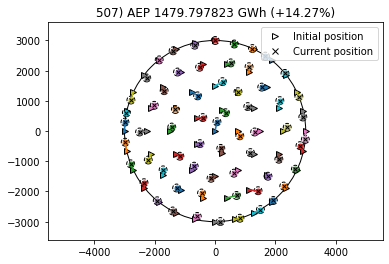

In [230]:
start_time=time.time()
cost, state, recorder= optimize_iea37_locs(64, 16, EasyScipyOptimizeDriver(optimizer='SLSQP', maxiter=1000 ,disp=False))
print("--- %s seconds ---" % (time.time() - start_time))

In [231]:
cost_64_slsq, state_64_slsq, recorder_64_slsq = cost, state, recorder

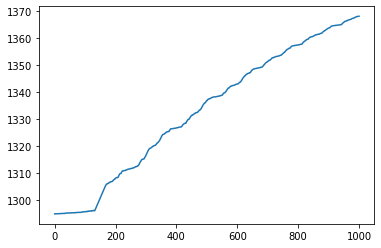

In [235]:
plt.plot(recorder_64_slsq.driver_iteration_dict['AEP'])

# COBYLA 64 

Calculate flow interaction: 100%|██████████| 64/64 [00:00<00:00, 1140.94wt/s]


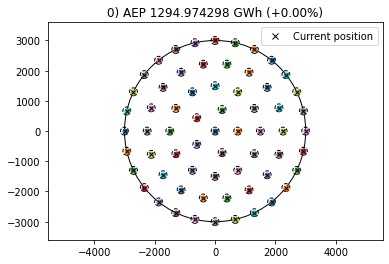

Calculate flow interaction: 100%|██████████| 64/64 [00:00<00:00, 2190.08wt/s]


Calculate flow interaction: 100%|██████████| 64/64 [00:00<00:00, 459.87wt/s]


Calculate flow interaction: 100%|██████████| 64/64 [00:00<00:00, 1976.25wt/s]


Calculate flow interaction: 100%|██████████| 64/64 [00:00<00:00, 1864.51wt/s]


Calculate flow interaction: 100%|██████████| 64/64 [00:00<00:00, 1749.48wt/s]


Calculate flow interaction: 100%|██████████| 64/64 [00:00<00:00, 1968.19wt/s]


Calculate flow interaction: 100%|██████████| 64/64 [00:00<00:00, 1528.78wt/s]


Calculate flow interaction: 100%|██████████| 64/64 [00:00<00:00, 1531.28wt/s]


Calculate flow interaction: 100%|██████████| 64/64 [00:00<00:00, 1546.28wt/s]


Calculate flow interaction: 100%|██████████| 64/64 [00:00<00:00, 1530.38wt/s]


Calculate flow interaction: 100%|██████████| 64/64 [00:00<00:00, 1506.44wt/s]


Optimization FAILED.
Did not converge to a solution satisfying the constraints. See `maxcv` for magnitude of violation.
-----------------------------------
--- 581.6138024330139 seconds ---


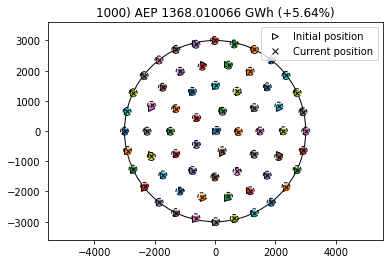

In [224]:
start_time=time.time()
cost, state, recorder= optimize_iea37_locs(64, 16, EasyScipyOptimizeDriver(optimizer='COBYLA', maxiter=1000 ,disp=False))
print("--- %s seconds ---" % (time.time() - start_time))


In [225]:
cost_64_COB, state_64_COB, recorder_64_COB = cost, state, recorder

In [ ]:
cost, state, recorder= optimize_iea37_locs(64, 16, EasyScipyOptimizeDriver(optimizer='SLSQP', maxiter=600 ,disp=False),
                                           state=)

# Run the same cases using RandomSearch

## RandomSearch with 9 WT

In [294]:
help(RandomizeTurbinePosition_Circle)

Help on class RandomizeTurbinePosition_Circle in module topfarm.drivers.random_search_driver:

class RandomizeTurbinePosition_Circle(RandomizeTurbinePosition)
 |  RandomizeTurbinePosition_Circle(max_step=None)
 |  
 |  Method resolution order:
 |      RandomizeTurbinePosition_Circle
 |      RandomizeTurbinePosition
 |      builtins.object
 |  
 |  Methods defined here:
 |  
 |  __init__(self, max_step=None)
 |      Initialize self.  See help(type(self)) for accurate signature.
 |  
 |  ----------------------------------------------------------------------
 |  Methods inherited from RandomizeTurbinePosition:
 |  
 |  __call__(self, desvar_dict, i_wt=None)
 |      Call self as a function.
 |  
 |  ----------------------------------------------------------------------
 |  Data descriptors inherited from RandomizeTurbinePosition:
 |  
 |  __dict__
 |      dictionary for instance variables (if defined)
 |  
 |  __weakref__
 |      list of weak references to the object (if defined)



randomize_func : f(desvar_dict)          Function to randomize desired variables of desvar_dict

In [292]:
help(EasyRandomSearchDriver)

Help on class EasyRandomSearchDriver in module topfarm.easy_drivers:

class EasyRandomSearchDriver(topfarm.drivers.random_search_driver.RandomSearchDriver, EasyDriverBase)
 |  EasyRandomSearchDriver(randomize_func, max_iter=100, max_time=600, disp=False, run_parallel=False)
 |  
 |  Top-level container for the systems and drivers.
 |  
 |  Attributes
 |  ----------
 |  fail : bool
 |      Reports whether the driver ran successfully.
 |  iter_count : int
 |      Keep track of iterations for case recording.
 |  options : <OptionsDictionary>
 |      Dictionary with general pyoptsparse options.
 |  recording_options : <OptionsDictionary>
 |      Dictionary with driver recording options.
 |  cite : str
 |      Listing of relevant citations that should be referenced when
 |      publishing work that uses this class.
 |  _problem : <Problem>
 |      Pointer to the containing problem.
 |  supports : <OptionsDictionary>
 |      Provides a consistent way for drivers to declare what features they

Calculate flow interaction: 100%|██████████| 9/9 [00:00<00:00, 1489.16wt/s]


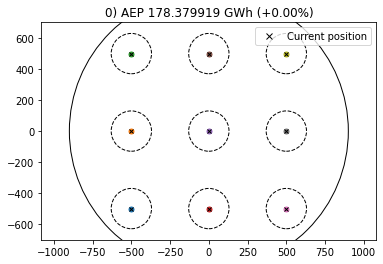

Calculate flow interaction: 100%|██████████| 9/9 [00:00<00:00, 1443.44wt/s]


Calculate flow interaction: 100%|██████████| 9/9 [00:00<00:00, 1818.60wt/s]


Calculate flow interaction: 100%|██████████| 9/9 [00:00<?, ?wt/s]


Calculate flow interaction: 100%|██████████| 9/9 [00:00<00:00, 2550.59wt/s]


Calculate flow interaction: 100%|██████████| 9/9 [00:00<00:00, 2205.46wt/s]


Calculate flow interaction: 100%|██████████| 9/9 [00:00<00:00, 1820.01wt/s]


Calculate flow interaction: 100%|██████████| 9/9 [00:00<00:00, 1793.29wt/s]


Calculate flow interaction: 100%|██████████| 9/9 [00:00<00:00, 1357.53wt/s]


Calculate flow interaction: 100%|██████████| 9/9 [00:00<00:00, 2887.31wt/s]


KeyboardInterrupt: 

IndexError: list index out of range

<Figure size 432x288 with 1 Axes>

In [295]:
start_time=time.time()
cost, state, recorder= optimize_iea37_locs(9, 16, EasyRandomSearchDriver(randomize_func=RandomizeTurbinePosition_Circle(max_step=300),
                                                                         max_iter=500))
print(' %s seconds ' % (time.time() - start_time))


In [201]:
cost_9_RS, state_9_RS, recorder_9_RS = cost, state, recorder

In [290]:
len(recorder_9_RS.driver_iteration_dict['AEP'])

678

# COBYLA 9 wt

In [212]:
help(EasyScipyOptimizeDriver)

Help on class EasyScipyOptimizeDriver in module topfarm.easy_drivers:

class EasyScipyOptimizeDriver(openmdao.drivers.scipy_optimizer.ScipyOptimizeDriver, EasyDriverBase)
 |  EasyScipyOptimizeDriver(optimizer='SLSQP', maxiter=200, tol=1e-08, disp=True, **kwargs)
 |  
 |  Driver wrapper for the scipy.optimize.minimize family of local optimizers.
 |  
 |  Inequality constraints are supported by COBYLA and SLSQP,
 |  but equality constraints are only supported by SLSQP. None of the other
 |  optimizers support constraints.
 |  
 |  ScipyOptimizeDriver supports the following:
 |      equality_constraints
 |      inequality_constraints
 |  
 |  Attributes
 |  ----------
 |  fail : bool
 |      Flag that indicates failure of most recent optimization.
 |  iter_count : int
 |      Counter for function evaluations.
 |  result : OptimizeResult
 |      Result returned from scipy.optimize call.
 |  opt_settings : dict
 |      Dictionary of solver-specific options. See the scipy.optimize.minimize d

Calculate flow interaction: 100%|██████████| 9/9 [00:00<00:00, 1438.10wt/s]


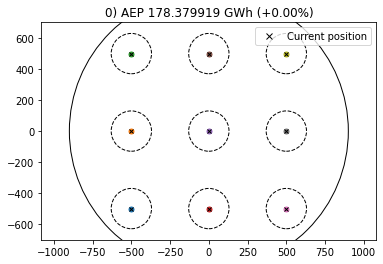

Calculate flow interaction: 100%|██████████| 9/9 [00:00<00:00, 1769.67wt/s]


Calculate flow interaction: 100%|██████████| 9/9 [00:00<00:00, 1091.54wt/s]


Calculate flow interaction: 100%|██████████| 9/9 [00:00<00:00, 1773.57wt/s]


Calculate flow interaction: 100%|██████████| 9/9 [00:00<00:00, 2860.40wt/s]


Calculate flow interaction: 100%|██████████| 9/9 [00:00<00:00, 1765.77wt/s]


Calculate flow interaction: 100%|██████████| 9/9 [00:00<00:00, 1765.77wt/s]


Calculate flow interaction: 100%|██████████| 9/9 [00:00<00:00, 1260.39wt/s]


Calculate flow interaction: 100%|██████████| 9/9 [00:00<00:00, 2224.70wt/s]


Calculate flow interaction: 100%|██████████| 9/9 [00:00<00:00, 2262.16wt/s]


Calculate flow interaction: 100%|██████████| 9/9 [00:00<00:00, 4023.53wt/s]


Calculate flow interaction: 100%|██████████| 9/9 [00:00<00:00, 2136.08wt/s]


Calculate flow interaction: 100%|██████████| 9/9 [00:00<00:00, 2251.24wt/s]


Calculate flow interaction: 100%|██████████| 9/9 [00:00<00:00, 1754.20wt/s]


Calculate flow interaction: 100%|██████████| 9/9 [00:00<00:00, 1132.34wt/s]


Calculate flow interaction: 100%|██████████| 9/9 [00:00<00:00, 1122.04wt/s]


Calculate flow interaction: 100%|██████████| 9/9 [00:00<00:00, 2062.10wt/s]


Calculate flow interaction: 100%|██████████| 9/9 [00:00<00:00, 2327.15wt/s]


Optimization FAILED.
Did not converge to a solution satisfying the constraints. See `maxcv` for magnitude of violation.
-----------------------------------
 264.415367603302 seconds 


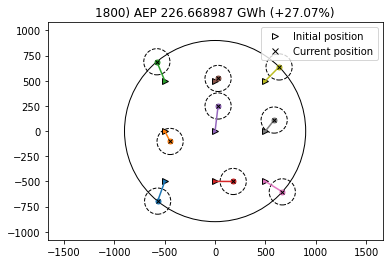

In [217]:
start_time=time.time()
cost, state, recorder= optimize_iea37_locs(9, 16, EasyScipyOptimizeDriver(optimizer='COBYLA',maxiter=1800,disp=False))
print(' %s seconds ' % (time.time() - start_time))

In [218]:
cost_9_COB, state_9_COB, recorder_9_COB = cost, state, recorder

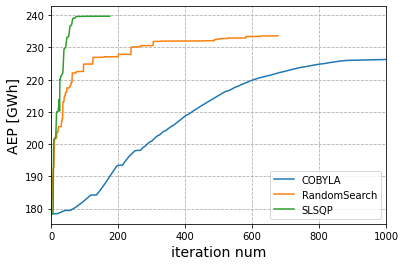

In [221]:
AEPs_COB= recorder_9_COB.driver_iteration_dict['AEP']
AEPs_rs = recorder_9_RS.driver_iteration_dict['AEP']
plt.plot(AEPs_COB, label='COBYLA')
plt.plot(AEPs_rs, label='RandomSearch')
plt.plot(AEPs_9sls, label='SLSQP')
#plt.title(f'Final AEP={np.round(AEPs_rs[-1],3)} GWh')
plt.xlim([0,1000])
plt.legend()
plt.ylabel('AEP [GWh]',fontsize=14)
plt.xlabel('iteration num',fontsize=14)
plt.grid(linestyle='--')
plt.show()

# RandomSearch 16 WT

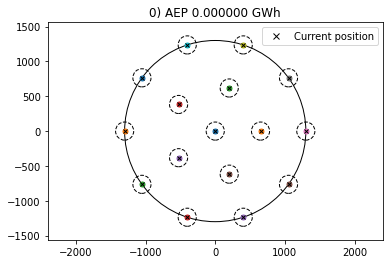

Calculate flow interaction: 100%|██████████| 16/16 [00:00<00:00, 2691.46wt/s]


Calculate flow interaction: 100%|██████████| 16/16 [00:00<00:00, 2671.53wt/s]


Calculate flow interaction: 100%|██████████| 16/16 [00:00<00:00, 3212.49wt/s]


Calculate flow interaction: 100%|██████████| 16/16 [00:00<00:00, 3986.27wt/s]


Calculate flow interaction: 100%|██████████| 16/16 [00:00<00:00, 2673.87wt/s]


Calculate flow interaction: 100%|██████████| 16/16 [00:00<00:00, 3212.80wt/s]


Calculate flow interaction: 100%|██████████| 16/16 [00:00<00:00, 3209.41wt/s]


Calculate flow interaction: 100%|██████████| 16/16 [00:00<00:00, 3208.49wt/s]


Calculate flow interaction: 100%|██████████| 16/16 [00:00<00:00, 3208.49wt/s]


Calculate flow interaction: 100%|██████████| 16/16 [00:00<00:00, 2677.82wt/s]


Calculate flow interaction: 100%|██████████| 16/16 [00:00<00:00, 2662.73wt/s]


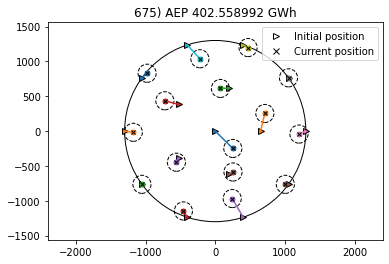

In [57]:
cost, state, recorder= optimize_iea37_locs(16, 16, EasyRandomSearchDriver(randomize_func=RandomizeTurbinePosition_Circle(max_step=300),
                                                                         max_iter=500))

In [58]:
cost_16_RS, state_16_RS, recorder_16_RS = cost, state, recorder

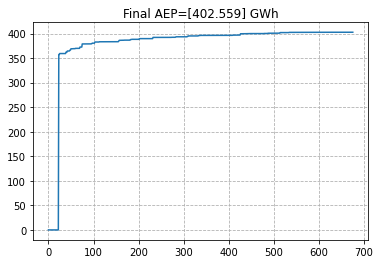

In [59]:
AEPs = recorder_16_RS.driver_iteration_dict['AEP']
plt.plot(AEPs)
plt.title(f'Final AEP={np.round(AEPs[-1],3)} GWh')
plt.grid(linestyle='--')
plt.show()

In [60]:
import time

# RandomSearch 36 WT

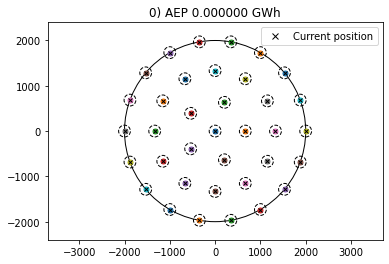

Calculate flow interaction: 100%|██████████| 36/36 [00:00<00:00, 3013.63wt/s]


Calculate flow interaction: 100%|██████████| 36/36 [00:00<00:00, 2578.42wt/s]


Calculate flow interaction: 100%|██████████| 36/36 [00:00<00:00, 2125.46wt/s]


Calculate flow interaction: 100%|██████████| 36/36 [00:00<00:00, 2781.06wt/s]


Calculate flow interaction: 100%|██████████| 36/36 [00:00<00:00, 3007.69wt/s]


Calculate flow interaction: 100%|██████████| 36/36 [00:00<00:00, 2776.05wt/s]


Calculate flow interaction: 100%|██████████| 36/36 [00:00<00:00, 2577.98wt/s]


Calculate flow interaction: 100%|██████████| 36/36 [00:00<00:00, 2251.91wt/s]


Calculate flow interaction: 100%|██████████| 36/36 [00:00<00:00, 3283.00wt/s]


Calculate flow interaction: 100%|██████████| 36/36 [00:00<00:00, 3281.57wt/s]


Calculate flow interaction: 100%|██████████| 36/36 [00:00<00:00, 3609.81wt/s]


--- 292.385267496109 seconds ---


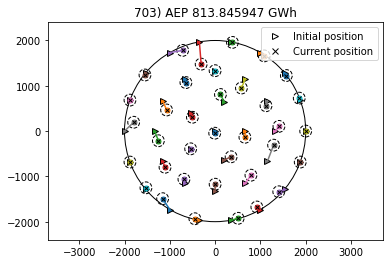

In [63]:
start_time = time.time()
cost, state, recorder= optimize_iea37_locs(36, 16, EasyRandomSearchDriver(randomize_func=RandomizeTurbinePosition_Circle(max_step=300),
                                                                         max_iter=500))
print("--- %s seconds ---" % (time.time() - start_time))

In [64]:
cost_36_RS, state_36_RS, recorder_36_RS = cost, state, recorder

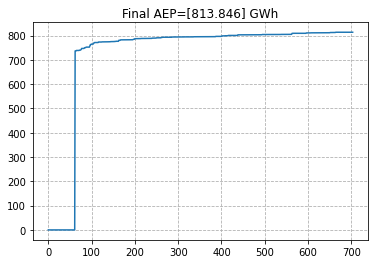

In [65]:
AEPs = recorder_36_RS.driver_iteration_dict['AEP']
plt.plot(AEPs)
plt.title(f'Final AEP={np.round(AEPs[-1],3)} GWh')
plt.grid(linestyle='--')
plt.show()

# RandomSearch 64 WT

Calculate flow interaction: 100%|██████████| 64/64 [00:00<00:00, 987.24wt/s]


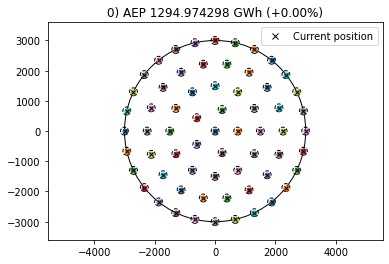

Calculate flow interaction: 100%|██████████| 64/64 [00:00<00:00, 3050.89wt/s]


Calculate flow interaction: 100%|██████████| 64/64 [00:00<00:00, 2790.42wt/s]


Calculate flow interaction: 100%|██████████| 64/64 [00:00<00:00, 2916.13wt/s]


Calculate flow interaction: 100%|██████████| 64/64 [00:00<00:00, 2912.52wt/s]


Calculate flow interaction: 100%|██████████| 64/64 [00:00<00:00, 2675.39wt/s]


Calculate flow interaction: 100%|██████████| 64/64 [00:00<00:00, 2912.55wt/s]


Calculate flow interaction: 100%|██████████| 64/64 [00:00<00:00, 3051.03wt/s]


Calculate flow interaction: 100%|██████████| 64/64 [00:00<00:00, 2674.57wt/s]


Calculate flow interaction: 100%|██████████| 64/64 [00:00<00:00, 2291.89wt/s]


Calculate flow interaction: 100%|██████████| 64/64 [00:00<00:00, 2678.22wt/s]


Calculate flow interaction: 100%|██████████| 64/64 [00:00<00:00, 3057.91wt/s]


--- 343.349338054657 seconds ---


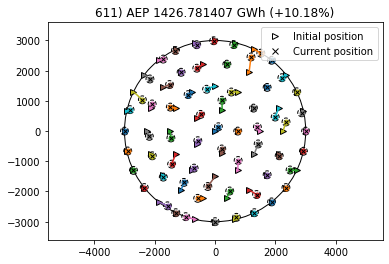

In [66]:
start_time = time.time()
cost, state, recorder= optimize_iea37_locs(64, 16, EasyRandomSearchDriver(randomize_func=RandomizeTurbinePosition_Circle(max_step=300),
                                                                         max_iter=500))
print("--- %s seconds ---" % (time.time() - start_time))

In [67]:
cost_64_RS, state_64_RS, recorder_64_RS = cost, state, recorder

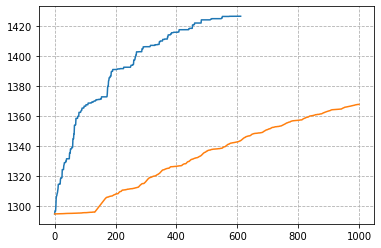

In [229]:
AEPs_rs = recorder_64_RS.driver_iteration_dict['AEP']
AEPs_cob =  recorder_64_COB.driver_iteration_dict['AEP']
plt.plot(AEPs_rs)
plt.plot(AEPs_cob)
#plt.title(f'Final AEP={np.round(AEPs[-1],3)} GWh')
plt.grid(linestyle='--')
plt.show()

In [74]:
recorder.driver_iteration_dict.keys()

dict_keys(['y', 'x', 'aggr_cost', 'wtSeparationSquared', 'boundaryDistances', 'penalty_circle_boundary_comp_0_0_3000', 'cost', 'cost_comp_eval', 'penalty', 'xy_boundary', 'plot_counter', 'penalty_spacing_comp_260', 'AEP', 'counter', 'iteration_coordinate', 'timestamp', 'success', 'msg'])

### Improve layout for 9 WT.


Calculate flow interaction: 100%|██████████| 9/9 [00:00<00:00, 333.73wt/s]


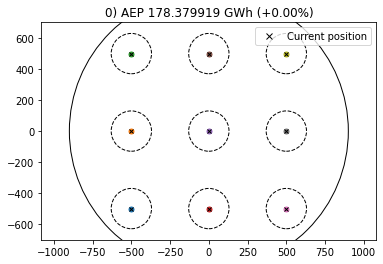

Calculate flow interaction: 100%|██████████| 9/9 [00:00<00:00, 2255.00wt/s]


Calculate flow interaction: 100%|██████████| 9/9 [00:00<00:00, 2256.35wt/s]


Calculate flow interaction: 100%|██████████| 9/9 [00:00<00:00, 2278.96wt/s]


Calculate flow interaction: 100%|██████████| 9/9 [00:00<00:00, 3007.87wt/s]


Calculate flow interaction: 100%|██████████| 9/9 [00:00<00:00, 2988.34wt/s]


Calculate flow interaction: 100%|██████████| 9/9 [00:00<00:00, 3008.35wt/s]


Calculate flow interaction: 100%|██████████| 9/9 [00:00<00:00, 2996.64wt/s]


Calculate flow interaction: 100%|██████████| 9/9 [00:00<00:00, 2256.22wt/s]


Calculate flow interaction: 100%|██████████| 9/9 [00:00<00:00, 2998.07wt/s]


Calculate flow interaction: 100%|██████████| 9/9 [00:00<00:00, 2255.95wt/s]


Calculate flow interaction: 100%|██████████| 9/9 [00:00<00:00, 3017.48wt/s]


Calculate flow interaction: 100%|██████████| 9/9 [00:00<00:00, 2271.01wt/s]


Calculate flow interaction: 100%|██████████| 9/9 [00:00<00:00, 1806.33wt/s]


Calculate flow interaction: 100%|██████████| 9/9 [00:00<00:00, 2241.21wt/s]


Calculate flow interaction: 100%|██████████| 9/9 [00:00<00:00, 3014.35wt/s]


Calculate flow interaction: 100%|██████████| 9/9 [00:00<00:00, 2255.54wt/s]


Calculate flow interaction: 100%|██████████| 9/9 [00:00<00:00, 2270.33wt/s]


Calculate flow interaction: 100%|██████████| 9/9 [00:00<00:00, 2239.35wt/s]


Calculate flow interaction: 100%|██████████| 9/9 [00:00<00:00, 2256.35wt/s]


Calculate flow interaction: 100%|██████████| 9/9 [00:00<00:00, 2273.06wt/s]


Calculate flow interaction: 100%|██████████| 9/9 [00:00<00:00, 1804.35wt/s]


Calculate flow interaction: 100%|██████████| 9/9 [00:00<00:00, 3008.59wt/s]


Calculate flow interaction: 100%|██████████| 9/9 [00:00<00:00, 2256.48wt/s]


Calculate flow interaction: 100%|██████████| 9/9 [00:00<00:00, 2256.22wt/s]


Calculate flow interaction: 100%|██████████| 9/9 [00:00<00:00, 2255.68wt/s]


Calculate flow interaction: 100%|██████████| 9/9 [00:00<00:00, 2255.54wt/s]


Calculate flow interaction: 100%|██████████| 9/9 [00:00<00:00, 2256.22wt/s]


Calculate flow interaction: 100%|██████████| 9/9 [00:00<00:00, 2255.68wt/s]


Calculate flow interaction: 100%|██████████| 9/9 [00:00<00:00, 3007.87wt/s]


Calculate flow interaction: 100%|██████████| 9/9 [00:00<00:00, 2255.54wt/s]


Calculate flow interaction: 100%|██████████| 9/9 [00:00<00:00, 2274.16wt/s]


--- 84.31398415565491 seconds ---


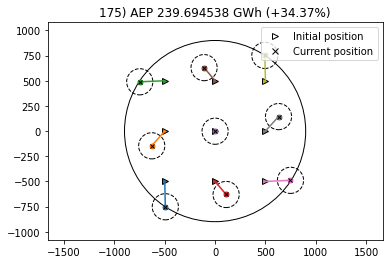

In [78]:
start_time=time.time()
cost, state, recorder= optimize_iea37_locs(9, 16, EasyScipyOptimizeDriver(optimizer='SLSQP',disp=False))
print("--- %s seconds ---" % (time.time() - start_time))

In [98]:
help(EasyScipyOptimizeDriver)

Help on class EasyScipyOptimizeDriver in module topfarm.easy_drivers:

class EasyScipyOptimizeDriver(openmdao.drivers.scipy_optimizer.ScipyOptimizeDriver, EasyDriverBase)
 |  EasyScipyOptimizeDriver(optimizer='SLSQP', maxiter=200, tol=1e-08, disp=True, **kwargs)
 |  
 |  Driver wrapper for the scipy.optimize.minimize family of local optimizers.
 |  
 |  Inequality constraints are supported by COBYLA and SLSQP,
 |  but equality constraints are only supported by SLSQP. None of the other
 |  optimizers support constraints.
 |  
 |  ScipyOptimizeDriver supports the following:
 |      equality_constraints
 |      inequality_constraints
 |  
 |  Attributes
 |  ----------
 |  fail : bool
 |      Flag that indicates failure of most recent optimization.
 |  iter_count : int
 |      Counter for function evaluations.
 |  result : OptimizeResult
 |      Result returned from scipy.optimize call.
 |  opt_settings : dict
 |      Dictionary of solver-specific options. See the scipy.optimize.minimize d

Calculate flow interaction: 100%|██████████| 9/9 [00:00<00:00, 2256.48wt/s]


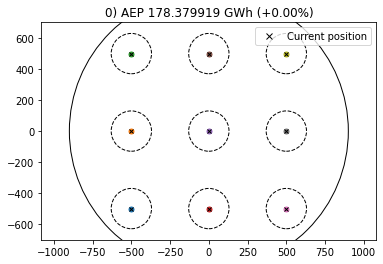

Calculate flow interaction: 100%|██████████| 9/9 [00:00<00:00, 2273.61wt/s]


Calculate flow interaction: 100%|██████████| 9/9 [00:00<00:00, 2982.91wt/s]


Calculate flow interaction: 100%|██████████| 9/9 [00:00<00:00, 2255.27wt/s]


Optimization FAILED.
Maximum number of function evaluations has been exceeded.
-----------------------------------
--- 18.149209022521973 seconds ---


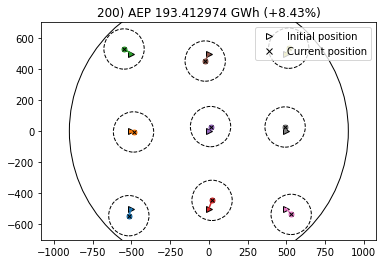

In [100]:
start_time=time.time()
cost, state, recorder= optimize_iea37_locs(9, 16, EasyScipyOptimizeDriver(optimizer='COBYLA',disp=False))
print("--- %s seconds ---" % (time.time() - start_time))

In [101]:
cost_9wt_cobyla, state_9wt_cobyla, recorder_9wt_cobyla = cost, state, recorder

Starting with COBYLA initial position:

Calculate flow interaction: 100%|██████████| 9/9 [00:00<00:00, 3040.57wt/s]


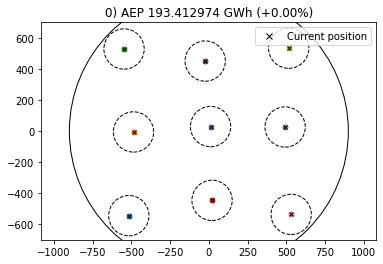

Calculate flow interaction: 100%|██████████| 9/9 [00:00<00:00, 2256.08wt/s]


Calculate flow interaction: 100%|██████████| 9/9 [00:00<00:00, 2245.88wt/s]


Calculate flow interaction: 100%|██████████| 9/9 [00:00<00:00, 4512.70wt/s]


Optimization FAILED.
Maximum number of function evaluations has been exceeded.
-----------------------------------
--- 17.423675775527954 seconds ---


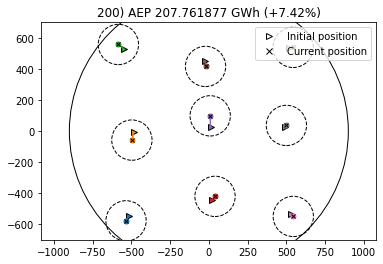

In [102]:
start_time=time.time()
cost, state, recorder= optimize_iea37_locs(9, 16, EasyScipyOptimizeDriver(optimizer='COBYLA',disp=False), state=state_9wt_cobyla)
print("--- %s seconds ---" % (time.time() - start_time))

# PyWake

In [121]:
from py_wake import IEA37SimpleBastankhahGaussian

In [ ]:
IEA37SimpleBastankhahGaussian

In [126]:
sbg=IEA37SimpleBastankhahGaussian(site, wind_turbines)

In [129]:
simRes=sbg(site.initial_position[:,0],site.initial_position[:,1])
print ("Total AEP: %f GWh"%simRes.aep().sum())

Total AEP: 195.687052 GWh


<Figure size 432x432 with 0 Axes>

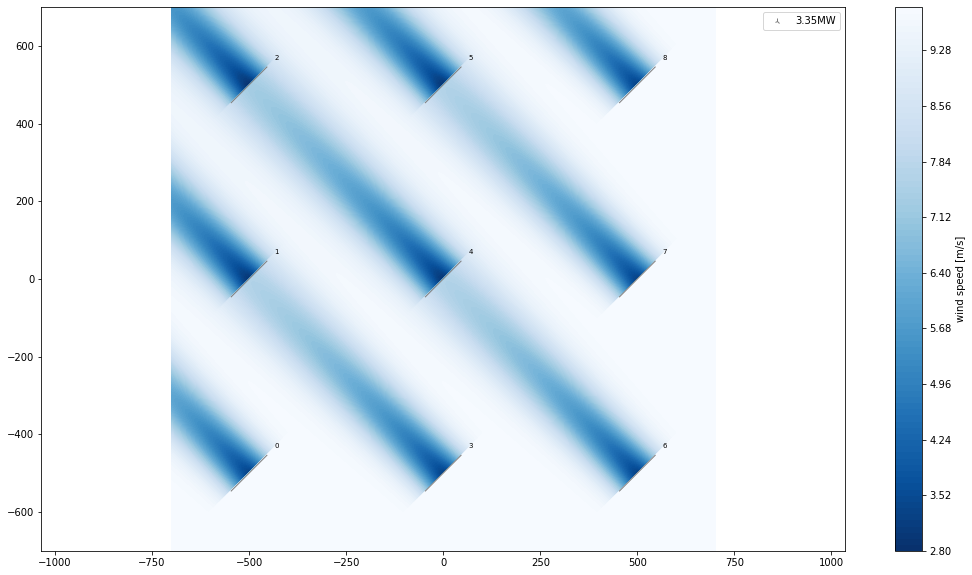

In [269]:
plt.figure(figsize=(6,6))
flow_map = simRes.flow_map(ws=9.8, wd=135)
plt.figure(figsize=(18,10))
flow_map.plot_wake_map()
